# import

In [1]:
import numpy as np
import pandas as pd
import statistics
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages
from matplotlib import rcParams
from operator import itemgetter
from typing import Callable, Dict, List, Set, Tuple
from scipy.optimize import curve_fit
import csv
import json
from collections import defaultdict

import numpy as np
import pandas as pd
import statistics
import matplotlib.pyplot as plt
from matplotlib import rcParams
from operator import itemgetter
from typing import Callable, Dict, List, Set, Tuple
from scipy.signal import savgol_filter
import math 

In [2]:
from util import calculate_derivative,pointInterval_to_pressure
from baseline import detect_breakpoints_startPoint, detect_breakpoints, detect_breakpoints_2, detect_breakpoints_3,detect_breakpoints_4,detect_breakpoints_startPoint2
from plot import PlotNSave
from data_load_N_preprocess import LoadNPreprocessData
from pattern_recognition3 import polyval_func_wrapper,linear_func_wrapper,PatternRecognition
# from pattern_recognition import polyval_func_wrapper,linear_func_wrapper,PatternRecognition

In [3]:
#!pip install astropy

In [4]:
file_path=pressure_filePath="../data_input/pattern_left.txt"
pattern_left = pd.read_csv(file_path, delimiter=" ",skiprows=1, names=["X", "Y"],skipinitialspace = True)
pattern_left["X"]= pattern_left["X"]-pattern_left["X"][0]
pattern_left["Y"]= pattern_left["Y"]-pattern_left["Y"][0]
print(pattern_left.describe())


pattern_left_top=pattern_left.loc[pattern_left["Y"]>0]
pattern_left_bottom=pattern_left.loc[pattern_left["Y"]<0]

                X           Y
count  106.000000  106.000000
mean    -6.447343    1.100501
std      3.845383    2.987507
min    -14.049790   -2.763160
25%     -9.565758   -2.051525
50%     -6.371515    1.160395
75%     -3.177262    4.181658
max      0.000000    5.118920


In [5]:
file_path=pressure_filePath="../data_input/pattern_right_top.txt"
pattern_right_top = pd.read_csv(file_path, delimiter=" ",skiprows=1, names=["X", "Y"],skipinitialspace = True)
pattern_right_top["X"]= pattern_right_top["X"]-pattern_right_top["X"][0]
pattern_right_top["Y"]= pattern_right_top["Y"]-pattern_right_top["Y"][0]
pattern_right_top= pattern_right_top.clip(lower=0)
print(pattern_right_top.describe())
# pd.set_option('display.max_rows', pattern_right_top.shape[0]+1)
# pattern_right_top 


               X          Y
count  69.000000  69.000000
mean    1.339242   8.207413
std     1.180701   5.028328
min     0.000000   0.000000
25%     0.371150   3.726520
50%     0.962310   8.391060
75%     2.050570  12.649460
max     4.186780  16.254090


In [6]:
file_path=pressure_filePath="../data_input/pattern_right_bottom.txt"
pattern_right_bottom = pd.read_csv(file_path, delimiter=" ",skiprows=1, names=["X", "Y"],skipinitialspace = True)
pattern_right_bottom["X"]= pattern_right_bottom["X"]-pattern_right_bottom["X"][0]
pattern_right_bottom["Y"]= pattern_right_bottom["Y"]-pattern_right_bottom["Y"][0]

pattern_right_bottom= pattern_right_bottom.clip(lower=0)

print(pattern_right_bottom.describe())


               X          Y
count  77.000000  77.000000
mean    5.628174   6.761963
std     3.985883   3.379727
min     0.000000   0.000000
25%     1.995140   4.067440
50%     5.219620   7.767010
75%     9.048680   9.699000
max    12.877740  10.923490


In [7]:
def test_func_1(x, a,b,c,d):
    y = a+b*x-c*np.exp(d*x)
    return y
def test_func_2(x, a,b,c,d):
    y = a+b*x-c*np.exp(-d*x)
    return y

In [8]:
def fit_curve(xdata,ydata,test_func):
    x = np.asarray(xdata)
    y = np.asarray(ydata)
    parameters, covariance = curve_fit(test_func, x, y)
#     parameters, covariance = curve_fit(test_func, xdata, ydata)

    fit_a = parameters[0]
    fit_b = parameters[1]
    fit_c = parameters[2]
    fit_d = parameters[3]

    print(F'The parameters is {parameters}.')


    y_fit = test_func(x, fit_a, fit_b,fit_c,fit_d)

    plt.plot(x, y, 'o', label='data')
    plt.plot(x, y_fit, '-', label='LJ fit')
    return fit_a,fit_b,fit_c,fit_d

The parameters is [ 4.12959938 -0.07459858  4.31571225  0.27952833].
The parameters is [-3.00297354e+00 -3.35921627e-04 -2.99822437e+00  2.29392013e-01].
The parameters is [13.14227315  0.78460405 13.4545323   0.90468973].
The parameters is [8.77210719 0.17952762 8.95294473 0.28833003].


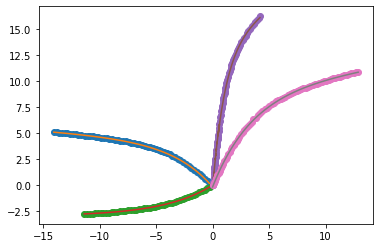

In [9]:
fit_parameters={}
curves=[pattern_left_top,pattern_left_bottom,pattern_right_top,pattern_right_bottom]
test_func=[test_func_1,test_func_1,test_func_2,test_func_2]
names=["pattern_left_top","pattern_left_bottom","pattern_right_top","pattern_right_bottom"]
for curve, func,name in zip(curves,test_func,names):
    xdata=curve["X"]
    ydata=curve["Y"]
    fit_parameters[name]=fit_curve(xdata,ydata,func)


In [10]:
def polyval_func_wrapper(x, *parameters):
    y = np.polyval(parameters,x)
    return y
def linear_func_wrapper(x, a,b):
    y = a*x+b
    return y
xdata=[1,2,3]
ydata=[4,5,6]
x = np.asarray(xdata)
y = np.asarray(ydata)
fitting_func=polyval_func_wrapper
parameters=np.polyfit(x,y,3)
# fitting_func=linear_func_wrapper
# parameters, covariance = curve_fit(fitting_func, x, y)
print(parameters)
y_fit=fitting_func(x, *parameters)
y_fit

[-0.0163292   0.09797518  0.82037884  3.09797518]


c:\users\junec\appdata\local\programs\python\python38-32\lib\site-packages\IPython\core\interactiveshell.py:3441: RankWarning: Polyfit may be poorly conditioned
  exec(code_obj, self.user_global_ns, self.user_ns)


array([4., 5., 6.])

# Synthetic_1

In [11]:
#experiment setup
ground_truth=[107, 164, 243, 328, 375, 446, 644, 713, 771, 820, 887, 953, 1036, 1101, 1179, 1254, 1319, 1396, 1456, 1513, 1598, 1648, 1719, 1784, 1875, 1938, 2017, 2073, 2185, 2247, 2315, 2369, 2433, 2487, 2552, 2610, 2835, 2916, 2965, 3044, 3101, 3240, 3284, 3368, 3411]
print(len(ground_truth))
# colum_names ={"pressure":{"Date","Pressure (psia)","first_order_derivative","second_order_derivative"},
#                     "rate":{"Time@end","Liquid rate (STB/D)"}}

colum_names={"pressure":{"time":"Date",
                        "measure":"Pressure (psia)",
                        "first_order_derivative":"first_order_derivative",
                        "second_order_derivative":"second_order_derivative"},
             "rate":{"time":"Time@end",
                     "measure":"Liquid rate (STB/D)"}}
data_inOneRow=400
pressure_filePath="../data_input/Synthetic_Data.xlsx"
rate_filePath="../data_input/Synthetic_Data.xlsx"

45


In [12]:
ground_truth_buildUp=[point for index, point in enumerate(ground_truth) if index%2!=0]
ground_truth_buildUp
len(ground_truth_buildUp)

22

In [13]:
ground_truth_buildDrawdown=[point for index, point in enumerate(ground_truth) if index%2==0]
ground_truth_buildDrawdown
len(ground_truth_buildDrawdown)

23

In [14]:
processed_data=LoadNPreprocessData(pressure_filePath=pressure_filePath, 
                 rate_filePath=rate_filePath, 
                 colum_names=colum_names, 
                 use_SG_smoothing=False)
pressure_df=processed_data.pressure_df
rate_df=processed_data.rate_df

display(pressure_df)
display(rate_df)

---load data from 'txt' or 'xlsx' files...
---The first & second order derivative has been calculated and appended to pressure dataframe


,Date,Pressure (psia),first_order_derivative,second_order_derivative
0,0.000000,2000.000000,15175.401994,-1.593896e+06
1,0.006111,2092.738568,5434.926885,-2.211251e+05
2,0.012222,2125.952010,4083.606969,-1.648675e+05
3,0.018056,2149.773050,3121.879672,-7.945161e+04
4,0.024167,2168.851204,2636.342081,-5.537004e+04
...,...,...,...,...
3514,5938.051389,2327.338989,-0.150989,1.763948e-04
3515,5968.345556,2322.764893,-0.145646,1.653610e-04
3516,5998.640000,2318.352641,-0.140636,1.544522e-04
3517,6028.934444,2314.092149,-0.135957,0.000000e+00


,Time@end,Liquid rate (STB/D)
0,0.000000,-6742.395145
1,253.216667,-8513.514104
2,264.358333,0.000000
3,274.191667,-5548.484464
4,296.716667,-8951.244013
...,...,...
90,4465.793056,0.107707
91,4465.834722,0.105123
92,4465.909722,-1909.311284
93,5058.868056,-5453.279913


In [ ]:
pressure_measure=list(pressure_df[colum_names["pressure"]["measure"]])
pressure_time=list(pressure_df[colum_names["pressure"]["time"]])
identfication_UsePattern=PatternRecognition()
identfication_UsePattern.learn(pressure_measure,pressure_time,ground_truth_buildDrawdown)
# identfication_UsePattern.parameters_twoPatterns

## single curve fitting plot for drawdown

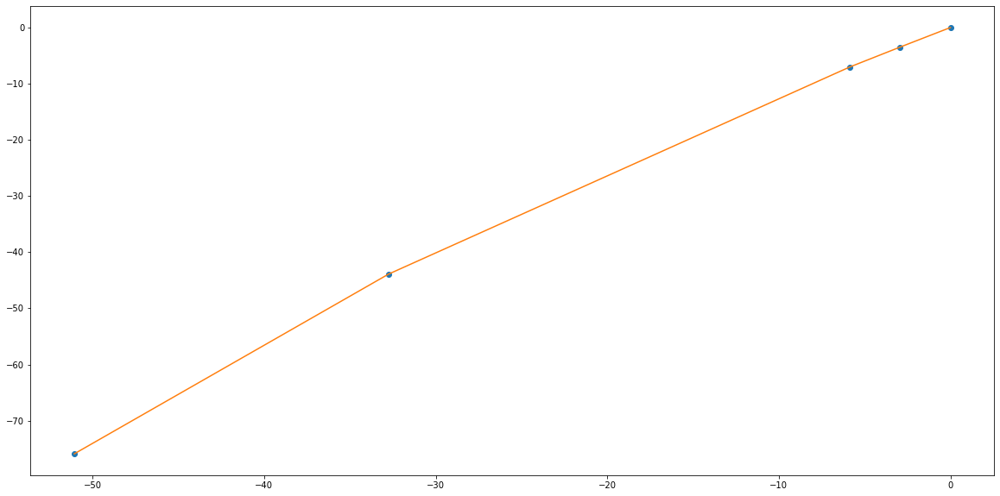

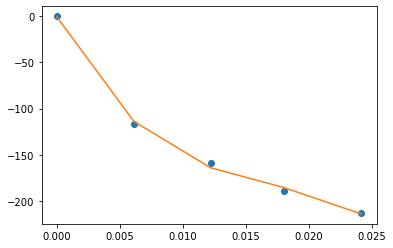

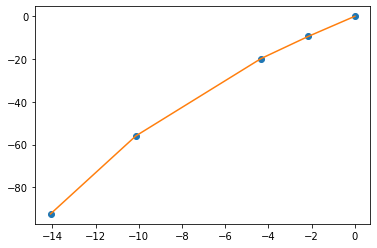

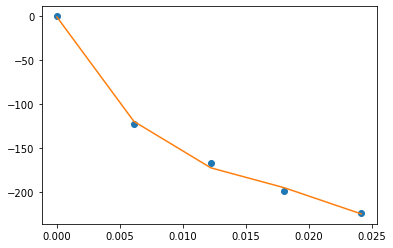

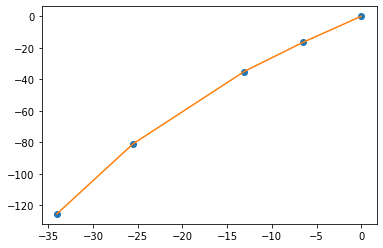

...

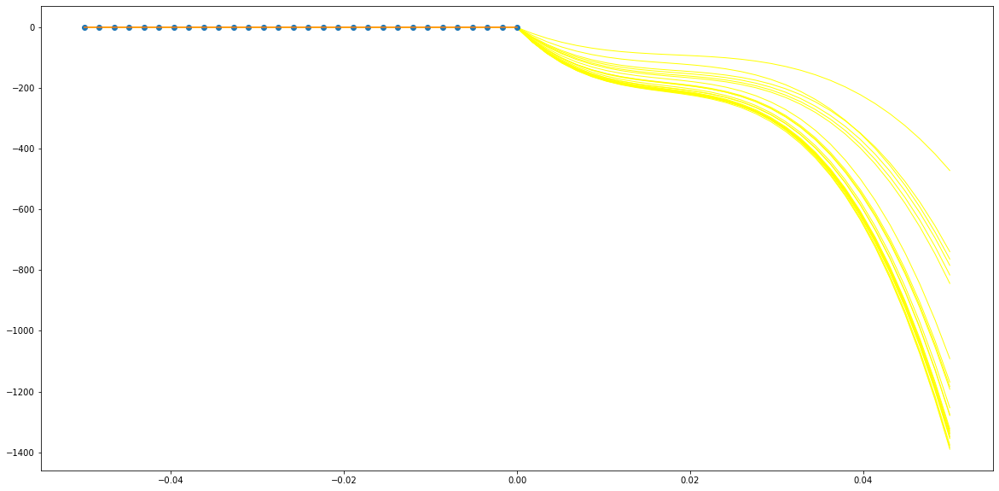

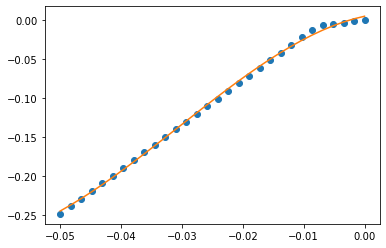

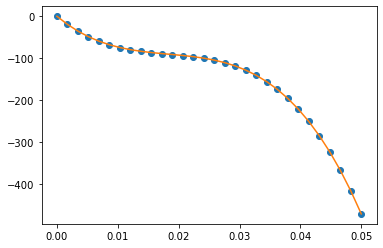

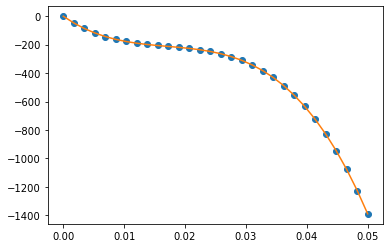

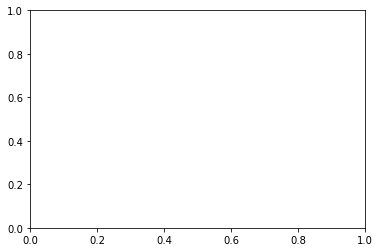

In [15]:
pressure_measure=list(pressure_df[colum_names["pressure"]["measure"]])
pressure_time=list(pressure_df[colum_names["pressure"]["time"]])
identfication_UsePattern=PatternRecognition()
identfication_UsePattern.learn(pressure_measure,pressure_time,ground_truth_buildDrawdown)
# identfication_UsePattern.parameters_twoPatterns

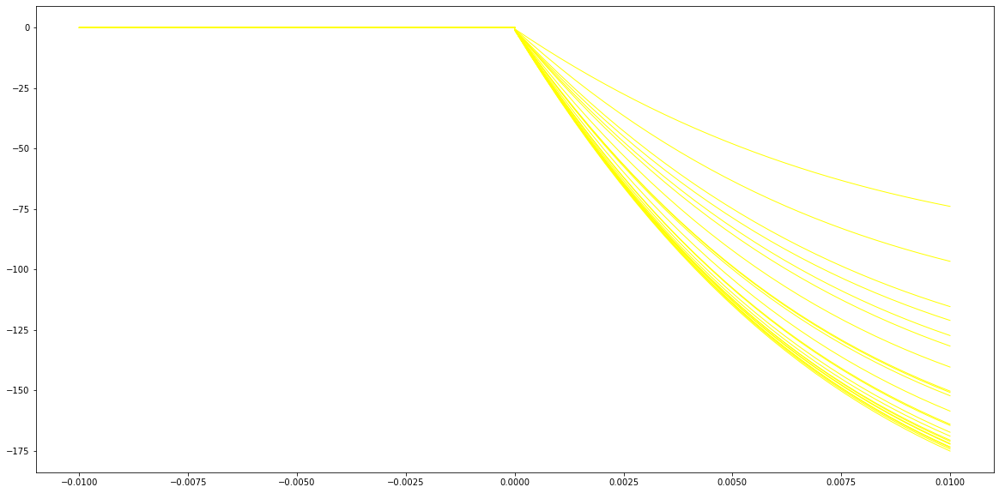

In [19]:
number=30
timeInterval=0.05
y_left_allCurve = np.empty((0, number), float)
y_right_allCurve = np.empty((0, number), float)
x_left=np.linspace(start = -0.01, stop = 0, num = number)
x_right=np.linspace(start = 0, stop = 0.01, num = number)

fig=plt.figure(figsize = (20, 10))
curve_number=len(identfication_UsePattern.parameters_allCurves)
for i in range(curve_number):
    y_left=identfication_UsePattern.fitting_func(x_left, identfication_UsePattern.parameters_allCurves["left_curves_parameters"][i])
    y_right=identfication_UsePattern.fitting_func(x_right, identfication_UsePattern.parameters_allCurves["right_curves_parameters"][i])

    y_left_allCurve=np.append(y_left_allCurve,np.array([y_left]), axis=0)
    y_right_allCurve=np.append(y_right_allCurve,np.array([y_right]), axis=0)



    plt.plot(x_right, y_right, '-', label='New_fit',
         color="yellow",linewidth=1)
    plt.plot(x_left, y_left, '-', label='New_fit',
             color="yellow",linewidth=1)   

In [17]:
identfication_UsePattern.parameters_allCurves

,left_curves_parameters,right_curves_parameters
0,"[5.825779166210675e-05, -0.003076299270022085,...","[-25439779.782496437, 1305731.7058000371, -255..."
1,"[0.010006757581135272, -0.02149463803860218, 4...","[-26748084.541755076, 1372879.255569968, -2682..."
2,"[0.0009725907473001219, -0.002274200260008804,...","[-28220739.214589205, 1448467.1965302154, -283..."
3,"[2.0207824148681746e-06, -0.000673602867109790...","[-29530577.699926734, 1515698.3983067938, -296..."
4,"[0.0005751894468209895, 0.00870273204304437, 1...","[-29091908.78901348, 1502600.718632119, -29391..."
5,"[6.355748010284458e-05, -0.0003764472009621092...","[-28656847.142956976, 1480129.730721688, -2895..."
6,"[0.019425115218814754, -0.025719835370105238, ...","[-27483248.313711416, 1419513.0633115543, -277..."
7,"[6.328727846283953e-05, -0.001007753848157923,...","[-28855795.94192032, 1490405.4621852676, -2915..."
8,"[8.455185304909013e-05, -0.0026623327808248548...","[-10767437.430783624, 593868.4282508221, -1220..."
9,"[0.03908740105953, 0.10461514424572044, 5.3057...","[-23520763.64116691, 1214850.1910103024, -2375..."


In [18]:
x_left=np.linspace(start = -0.05, stop = 0, num = 30)
parameters=identfication_UsePattern.parameters_twoPatterns['buildUp']['left_top']
y1=polyval_func_wrapper(x_left, *parameters)
parameters=identfication_UsePattern.parameters_twoPatterns['buildUp']['left_bottom']
y2=polyval_func_wrapper(x_left, *parameters)
plt.plot(x_left, y1,color="red",  marker='o')
plt.plot(x_left, y2, color="blue",linestyle='-')

AttributeError: 'PatternRecognition' object has no attribute 'parameters_twoPatterns'

In [ ]:
x_left=np.linspace(start = -0.05, stop = 0, num = 30)
parameters=identfication_UsePattern.parameters_twoPatterns['drawDown']['left_top']
y1=polyval_func_wrapper(x_left, *parameters)
parameters=identfication_UsePattern.parameters_twoPatterns['drawDown']['left_bottom']
y2=polyval_func_wrapper(x_left, *parameters)
plt.plot(x_left, y1,color="red",  marker='o')
plt.plot(x_left, y2, color="blue",linestyle='-')

In [ ]:
identfication_UsePattern.parameters_twoPatterns

In [ ]:
identfication_UsePattern.parameters_allCurves

In [ ]:
buildup,drawdown=identfication_UsePattern.predict(pressure_measure,pressure_time)
buildup,drawdown

In [ ]:
len(buildup),len(drawdown)

In [ ]:
display(identfication_UsePattern.data_forPredict.iloc[0]["buildUp"])
identfication_UsePattern.data_forPredict.iloc[0]["drawDown"]

In [ ]:
identfication_UsePattern.data_forPredict

In [ ]:
filename_toSave=""
plot_name="Synthetic_PatternRecognition_method"
plot_whole=True
plot_details=True
plot_statistics=False
PlotNSave(pressure_df,
          rate_df,
          buildup,
          [],
          data_inOneRow,
          plot_name,
          filename_toSave,
          plot_statistics,
          plot_whole,
          plot_details,
          colum_names)

In [ ]:
pressure_measure=list(pressure_df[colum_names["pressure"]["measure"]])
pressure_time=list(pressure_df[colum_names["pressure"]["time"]])
identfication_UsePattern=PatternRecognition(point_halfWindow=5,time_halfWindow=0.005,)
identfication_UsePattern.learn(pressure_measure,pressure_time,ground_truth)
identfication_UsePattern.parameters_twoPatterns

# real case data

## raw data

In [21]:
#experiment setup
ground_truth_temp=[2249,  2467,  2805,[2875, 2876],3100,3561,3994,[4228, 4232],4753,4895, 5297,5436,5985,[6543, 6547], 7249,[7544, 7545],7946,[8362, 8364],9025,[9607, 9608],10149,10216, 10528,[10801, 10804],11340,  11479,12363,[13039, 13040],13868, 14086,14774,15341,16098,16619,[17589, 17590],18435,19643,19764,20021,20349,20701,21030,21974,22186,22710,23220,24215,24685,25717,26006,26656, 26759,27023,[27316,27327],27773,[27966,27970],28322,28497,28832,29115]
# ground_truth=[]

colum_names   ={"pressure":{"time":"Elapsed time",
                             "measure":"Data",
                             "first_order_derivative":"first_order_derivative",
                             "second_order_derivative":"second_order_derivative"},
                "rate":{"time":"Elapsed time",
                        "measure":"Liquid rate"}}
data_inOneRow=1000
pressure_filePath="../data_input/EAGE_Shchipanov_2017/Pressure.txt"
rate_filePath="../data_input/EAGE_Shchipanov_2017/Rate.txt"

ground_truth=[]
for point in ground_truth_temp: 
    if "list" in str(type(point)):
        ground_truth.append(math.ceil(sum(point)/len(point)))
    else:
        ground_truth.append(point)
                     
print("len(ground_truth):",len(ground_truth))
processed_data=LoadNPreprocessData(pressure_filePath=pressure_filePath, 
                 rate_filePath=rate_filePath, 
                 colum_names=colum_names, 
                 use_SG_smoothing=False)
pressure_df=processed_data.pressure_df
rate_df=processed_data.rate_df

display(pressure_df)
display(rate_df)
# display(processed_data.pressureNrate_df)

first_order_derivative=pressure_df["first_order_derivative"]
second_order_derivative=pressure_df["second_order_derivative"]

len(ground_truth): 60
---load data from 'txt' or 'xlsx' files...
check the time type
---The first & second order derivative has been calculated and appended to pressure dataframe


,Elapsed time,Data,first_order_derivative,second_order_derivative
0,0.000000,2988.99,4.618487,284.977831
1,0.495833,2991.28,145.919995,-3087.359588
2,0.516667,2994.32,81.600002,1184.914121
3,0.545833,2996.70,116.159996,-1817.279726
4,0.566667,2999.12,78.300001,-168.428622
...,...,...,...,...
29808,4063.495571,7938.65,0.439085,0.126970
29809,4065.499737,7939.53,0.693555,-0.271368
29810,4067.503904,7940.92,0.149688,-0.123142
29811,4069.508071,7941.22,-0.097110,0.000000


,Elapsed time,Liquid rate
0,0.433384,-3916.602731
1,2.516718,-3913.489043
2,4.600051,-3911.804387
3,6.641718,-3910.573563
4,7.683384,-3907.017652
...,...,...
10186,4074.862089,-18459.075655
10187,4075.028756,-18423.899451
10188,4075.237089,-18412.745895
10189,4075.362089,-18413.519153


In [ ]:
pressure_measure=list(pressure_df[colum_names["pressure"]["measure"]])
pressure_time=list(pressure_df[colum_names["pressure"]["time"]])
identfication_UsePattern=PatternRecognition(delta_pointNumber =5)
identfication_UsePattern.learn(pressure_measure,pressure_time,ground_truth)
identfication_UsePattern.parameters_twoPatterns

In [ ]:
buildup,drawdown=identfication_UsePattern.predict(pressure_measure,pressure_time)
print(len(buildup),len(drawdown))
buildup,drawdown

In [ ]:
print(len(breakpoints))
breakpoints

In [ ]:
buildup,drawdown=identfication_UsePattern.detect_breakpoint_type(pressure_measure,pressure_time,ground_truth)
# identfication_UsePattern.parameters_allCurves
print(len(buildup),buildup)
# print(len(ground_truth_buildUp),ground_truth_buildUp)
print(len(drawdown),drawdown)

In [ ]:
breakpoint_buildUp=[]
breakpoint_drawDown=[]
for index,parameter in identfication_UsePattern.parameters_allCurves.iterrows():
    #compare slope and convert index in the parameters_allCurves to in pressure_df
    if parameter["left_curves_parameters"][0]<parameter["right_curves_parameters"][0]:
        breakpoint_buildUp.append(ground_truth_buildUp[index])
    else:
        breakpoint_drawDown.append(ground_truth_buildUp[index])


In [ ]:
# data={"left_curve_parameters":identfication_UsePattern.curveLeft_parameters,
#      "right_curve_parameters":identfication_UsePattern.curveRight_parameters}
# df=pd.DataFrame(data)
# display(df)
# for index,row in df.iterrows():
#     print(row["left_curve_parameters"], row["left_curve_parameters"][-1])

In [ ]:
identfication_UsePattern.sav_pattern()

In [ ]:
identfication_UsePattern.load_pattern()
identfication_UsePattern.parameters_PatternField 

In [ ]:
filePath_learnedPattern="../data_output/Learned_Pattern.csv"
border_names=["left_top","left_bottom","right_top","right_bottom"]
paras_df = pd.read_csv(filePath_learnedPattern, delimiter=" ",skiprows=1, names=border_names,skipinitialspace = True) 
paras_df

In [ ]:
# #spline interpolation
# x_i=np.linspace(0,10,100)
# f_spline=interpld(xdata,ydata,kind="cubic")
# y_is=f_spline(x_i)

In [ ]:
a={"pressure_time_right":[1,2,3],
"pressure_measure_right":[4,5,6]}
b={key:[value] for key,value in a.items()}
pd.DataFrame(a)
pd.DataFrame(b)

In [ ]:
curveData= pd.DataFrame({'Odd':[[1,3,15,6,7,9]], 'Even':[[0,12,4,6,8,10]]})
data = pd.DataFrame({'Odd':[[1,3,5,6,7,9]], 'Even':[[0,2,4,6,8,10]]})
curveData=curveData.append(data,ignore_index=True)
# data=data.iloc[::-1]
display(curveData)
for index,row in curveData.iterrows():
#     print(row)
#     row['Odd'].reverse()
    print(row.index)
display(curveData)

## denoised data

In [3]:
#experiment setup
ground_truth_temp=[2249,  2467,  2805,[2875, 2876],3100,3561,3994,[4228, 4232],4753,4895, 5297,5436,5985,[6543, 6547], 7249,[7544, 7545],7946,[8362, 8364],9025,[9607, 9608],10149,10216, 10528,[10801, 10804],11340,  11479,12363,[13039, 13040],13868, 14086,14774,15341,16098,16619,[17589, 17590],18435,19643,19764,20021,20349,20701,21030,21974,22186,22710,23220,24215,24685,25717,26006,26656, 26759,27023,[27316,27327],27773,[27966,27970],28322,28497,28832,29115]
# ground_truth=[]

colum_names   ={"pressure":{"time":"Elapsed time",
                             "measure":"Data",
                             "first_order_derivative":"first_order_derivative",
                             "second_order_derivative":"second_order_derivative"},
                "rate":{"time":"Elapsed time",
                        "measure":"Liquid rate"}}
data_inOneRow=1000
pressure_filePath="../data_input/EAGE_Shchipanov_2017/Pressure.txt"
rate_filePath="../data_input/EAGE_Shchipanov_2017/Rate.txt"
ground_truth=[]
for point in ground_truth_temp: 
    if "list" in str(type(point)):
        ground_truth.append(math.ceil(sum(point)/len(point)))
    else:
        ground_truth.append(point)
                     
print("len(ground_truth):",len(ground_truth))
print(ground_truth)

len(ground_truth): 60
[2249, 2467, 2805, 2876, 3100, 3561, 3994, 4230, 4753, 4895, 5297, 5436, 5985, 6545, 7249, 7545, 7946, 8363, 9025, 9608, 10149, 10216, 10528, 10803, 11340, 11479, 12363, 13040, 13868, 14086, 14774, 15341, 16098, 16619, 17590, 18435, 19643, 19764, 20021, 20349, 20701, 21030, 21974, 22186, 22710, 23220, 24215, 24685, 25717, 26006, 26656, 26759, 27023, 27322, 27773, 27968, 28322, 28497, 28832, 29115]


In [18]:
processed_data_denoised=LoadNPreprocessData(pressure_filePath=pressure_filePath, 
                 rate_filePath=rate_filePath, 
                 colum_names=colum_names, 
                 use_SG_smoothing=True)
pressure_df_denoised=processed_data_denoised.pressure_df

---load data from 'txt' or 'xlsx' files...
check the time type
---denoising data using S-G smoothing...
---The first & second order derivative has been calculated and appended to pressure dataframe


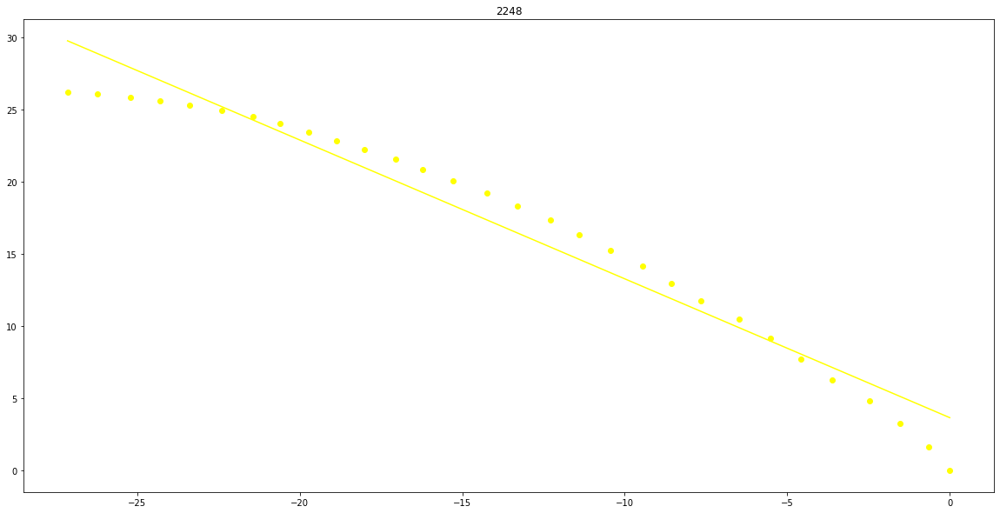

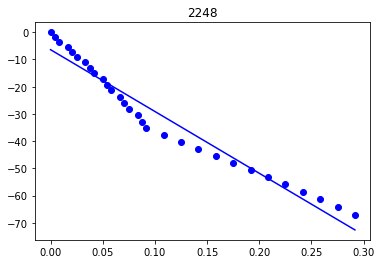

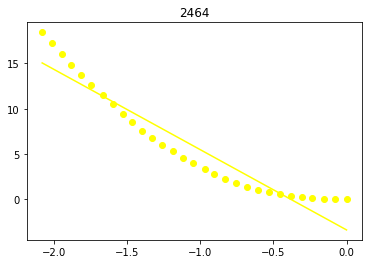

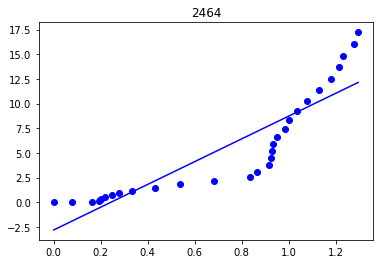

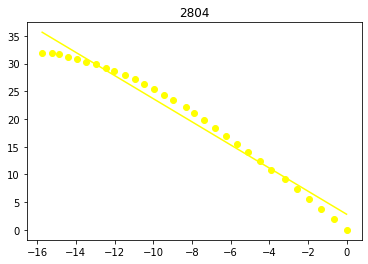

...

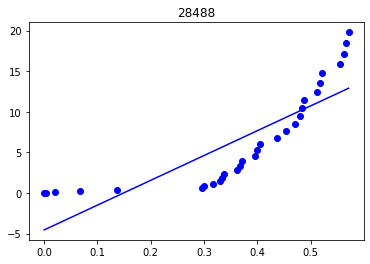

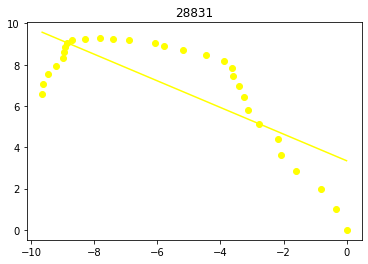

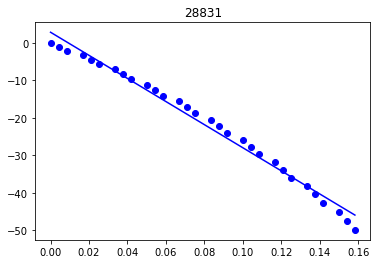

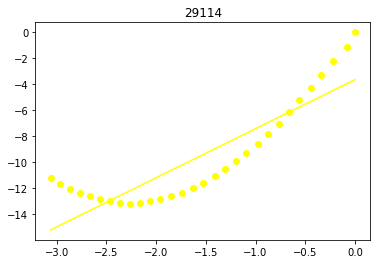

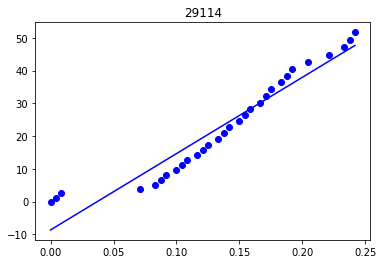

----ground_truth_buildUp,ground_truth_drawDown [2464, 2874, 3555, 4228, 4891, 5432, 6540, 7538, 8356, 9606, 10213, 10795, 11478, 13040, 14081, 15329, 16618, 18433, 19760, 20349, 21023, 22179, 23214, 24683, 26005, 26753, 27315, 27962, 28322, 28488, 29114] [2248, 2804, 3095, 3987, 4750, 5297, 5983, 7247, 7945, 9023, 10149, 10526, 11339, 12361, 13867, 14766, 16095, 17589, 19642, 20013, 20699, 21974, 22709, 24210, 25711, 26655, 27021, 27760, 28831]


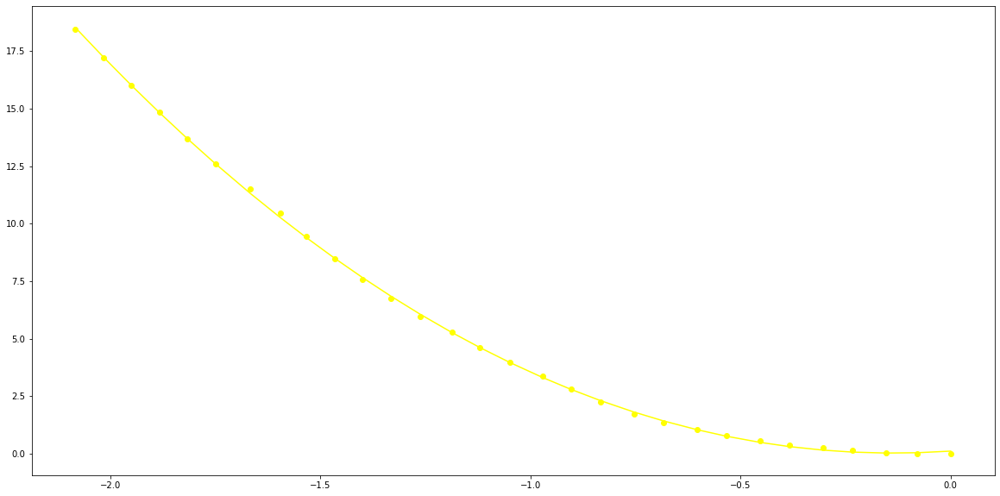

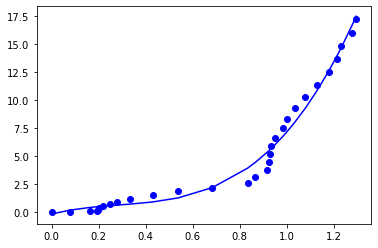

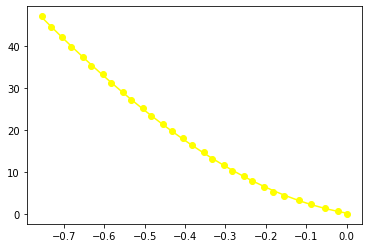

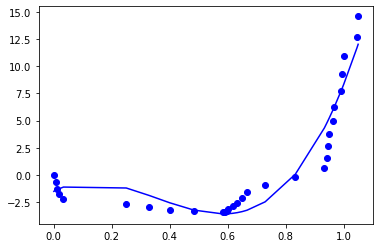

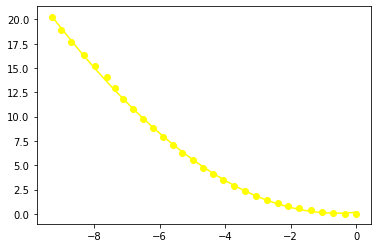

...

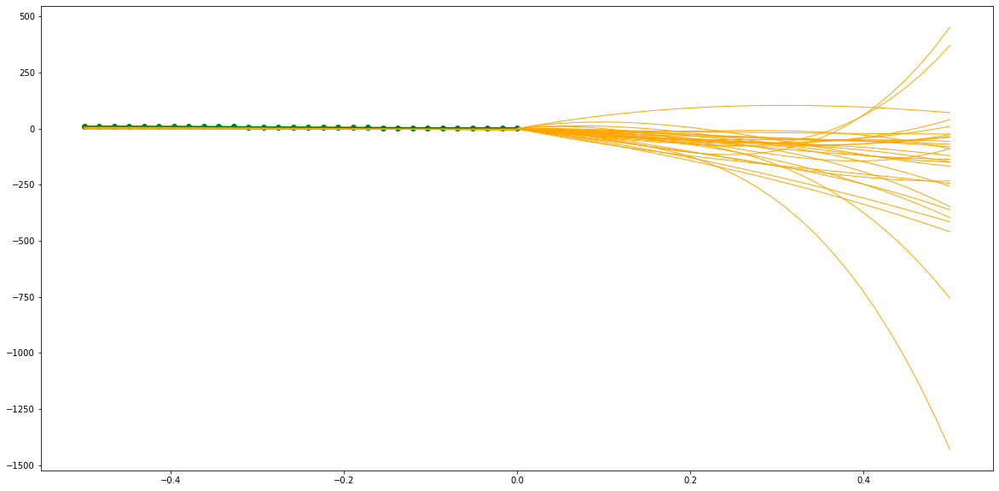

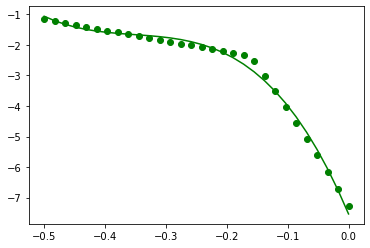

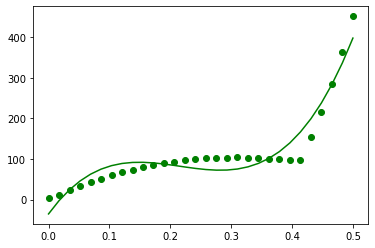

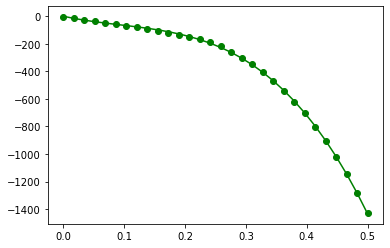

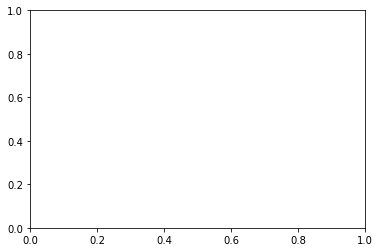

In [19]:
denoised_ground_truth=[2248, 2464, 2804, 2874, 3095, 3555, 3987, 4228, 4750, 4891, 5297, 5432, 5983, 6540, 7247, 7538, 7945, 8356, 9023, 9606, 10149, 10213, 10526, 10795, 11339, 11478, 12361, 13040, 13867, 14081, 14766, 15329, 16095, 16618, 17589, 18433, 19642, 19760, 20013, 20349, 20699, 21023, 21974, 22179, 22709, 23214, 24210, 24683, 25711, 26005, 26655, 26753, 27021, 27315, 27760, 27962, 28322, 28488, 28831, 29114]
pressure_df=pressure_df_denoised
pressure_measure=list(pressure_df[colum_names["pressure"]["measure"]])
pressure_time=list(pressure_df[colum_names["pressure"]["time"]])
identfication_UsePattern=PatternRecognition(point_halfWindow=30)
identfication_UsePattern.learn(pressure_measure,pressure_time,denoised_ground_truth)
# identfication_UsePattern.parameters_twoPatterns
# buildup,drawdown=identfication_UsePattern.predict(pressure_measure,pressure_time)
# print(len(buildup),len(drawdown))
# buildup,drawdown

In [13]:
identfication_UsePattern.breakpoints_forLearn

{'buildUp': [2467,
  2876,
  3561,
  4230,
  4895,
  5436,
  6545,
  7545,
  8363,
  9608,
  10216,
  10803,
  11479,
  13040,
  14086,
  15341,
  16619,
  18435,
  19764,
  20349,
  21030,
  22186,
  23220,
  24685,
  26006,
  26759,
  27322,
  27773,
  27968,
  28322,
  28497,
  29115],
 'drawDown': [2249,
  2805,
  3100,
  3994,
  4753,
  5297,
  5985,
  7249,
  7946,
  9025,
  10149,
  10528,
  11340,
  12363,
  13868,
  14774,
  16098,
  17590,
  19643,
  20021,
  20701,
  21974,
  22710,
  24215,
  25717,
  26656,
  27023,
  28832]}

In [13]:
import math
import numpy as np
import bisect
a=[1,2,3]
# a=np.asarray(a)
# np.log(a)

bisect.bisect_left(a, 1.5)

1

In [52]:
!conda install -c anaconda numpy

^C


In [59]:
# !pip install numpy --upgrade --ignore-installed
import numpy
print(numpy.__version__)


1.19.1


In [60]:
min([1,2,3,1,2,3])

1

(6, 6)
y_allCurve[:,column] [  9.   1.   1. -10.  -5.   1.]
y_allCurve[:,column] [2. 2. 2. 3. 3. 3.]
y_allCurve[:,column] [3.  3.2 3.  4.  2.  2. ]
y_allCurve[:,column] [1. 1. 1. 1. 1. 1.]
y_allCurve[:,column] [2. 2. 2. 2. 2. 2.]
y_allCurve[:,column] [ 3.  8.  3.  3. 13.  3.]
[-7.5  2.   2.   1.   2.   3. ] [ 5.   3.   3.6  1.   2.  10.5]


([-5.0, 2.0, 2.0, 1.0, 2.0, 3.0], [1.0, 3.0, 3.2, 1.0, 2.0, 8.0])

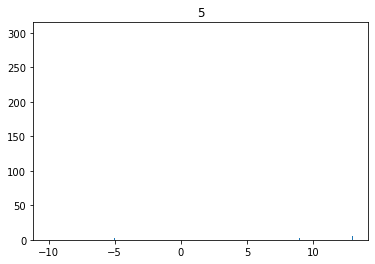

In [63]:
import matplotlib.pyplot as plt
y_allCurve=np.array([[9,2,3,1,2,3],[1,2,3.2,1,2,8],[1,2,3,1,2,3],[-10,3,4,1,2,3],[-5,3,2,1,2,13],[1,3,2,1,2,3]])
print(y_allCurve.shape)
type(y_allCurve)
a.max(axis=1)
y_allCurve_min=[]
y_allCurve_max=[]
upper_bound=np.percentile(y_allCurve, 90, axis=0)
lower_bound=np.percentile(y_allCurve, 10, axis=0)
for column_index in range(y_allCurve.shape[1]):
    print("y_allCurve[:,column]",y_allCurve[:,column_index])
    plot_histogram(y_allCurve[:,column_index],title=str(column_index))
    y_allCurve_columnTruncated=[y for y in y_allCurve[:,column_index] if y>=lower_bound[column_index] and y<=upper_bound[column_index]]
    y_allCurve_min.append(min(y_allCurve_columnTruncated))
    y_allCurve_max.append(max(y_allCurve_columnTruncated))
    plot_histogram(y_allCurve_columnTruncated,title=str(column_index))
print(lower_bound,upper_bound)
y_allCurve_min,y_allCurve_max

[2 2 2 2 3 3]


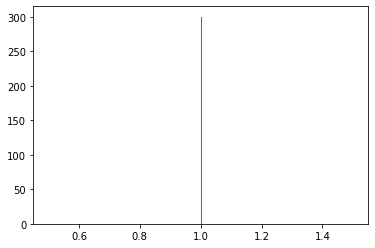

In [36]:
import matplotlib.pyplot as plt
a=np.array([[1,2,3],[1,2,3],[1,2,3],[1,2,3],[1,3,2],[1,3,2]])
a[:,1]
a.shape
rows,columns=a.shape
rows,columns
print(a[:,1])
np.histogram(a[:,1], bins=[0, 1, 2, 3])
def plot_histogram(data,density:bool=True, xlabel:str="", ylabel:str="",title:str="")->None:
    number_bins=300
    # plt.style.use('ggplot')
    plt.hist(data, bins=number_bins,density=density)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    # plt.legend(legend)
    plt.title(title)
    plt.show
plot_histogram(a[:,0])



943.0


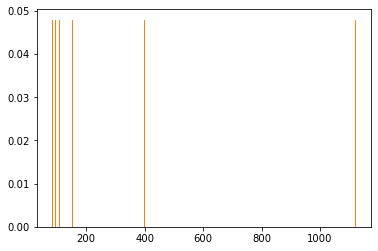

In [37]:
import numpy as np
a = [154, 400, 1124, 82, 94, 108]
plot_histogram(a)
print(np.percentile(a,95)) # gives the 95th percentile
plot_histogram(a)

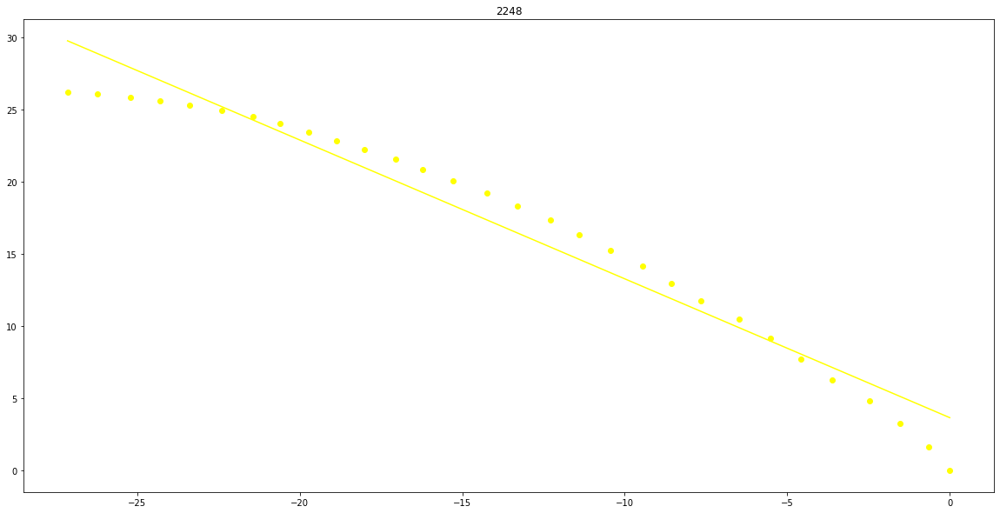

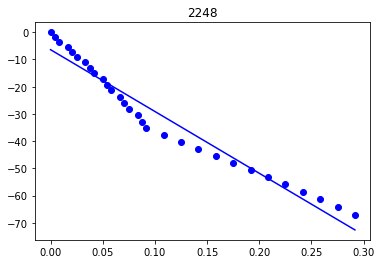

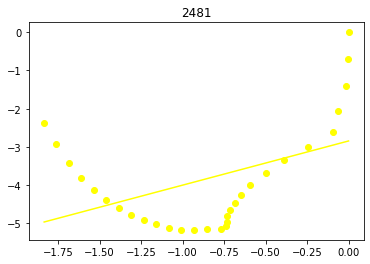

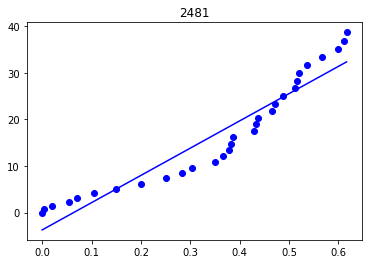

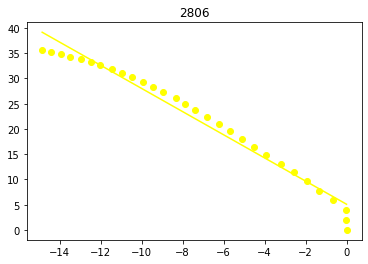

...

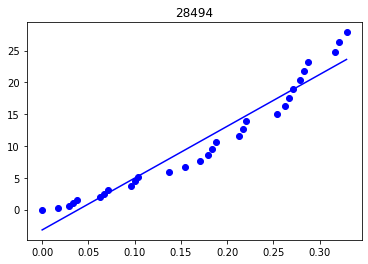

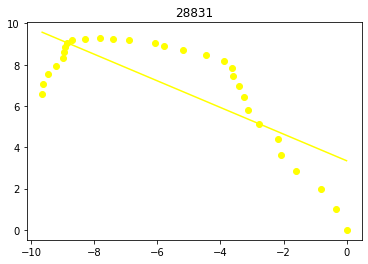

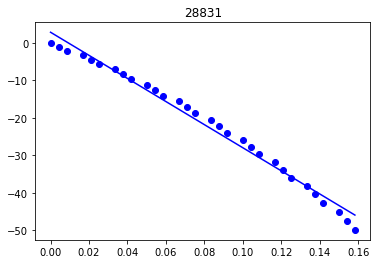

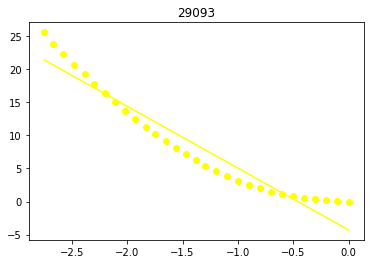

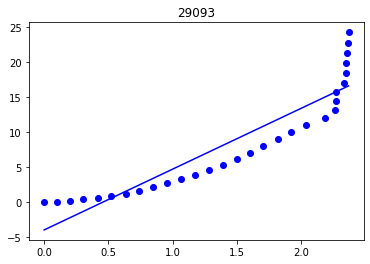

----ground_truth_buildUp,ground_truth_drawDown [2481, 2884, 3560, 4229, 4891, 5436, 6545, 7538, 8356, 10224, 10795, 11478, 13023, 14081, 15329, 16619, 18417, 19760, 20358, 21035, 22189, 23219, 24683, 26005, 26753, 27315, 27968, 28322, 28494, 29093] [2248, 2806, 3095, 3973, 4750, 5297, 5985, 7234, 7933, 9023, 9689, 10149, 10526, 11323, 12362, 13867, 14774, 16096, 17589, 19642, 20013, 20700, 21974, 22709, 24215, 25697, 26640, 27022, 27757, 28831]


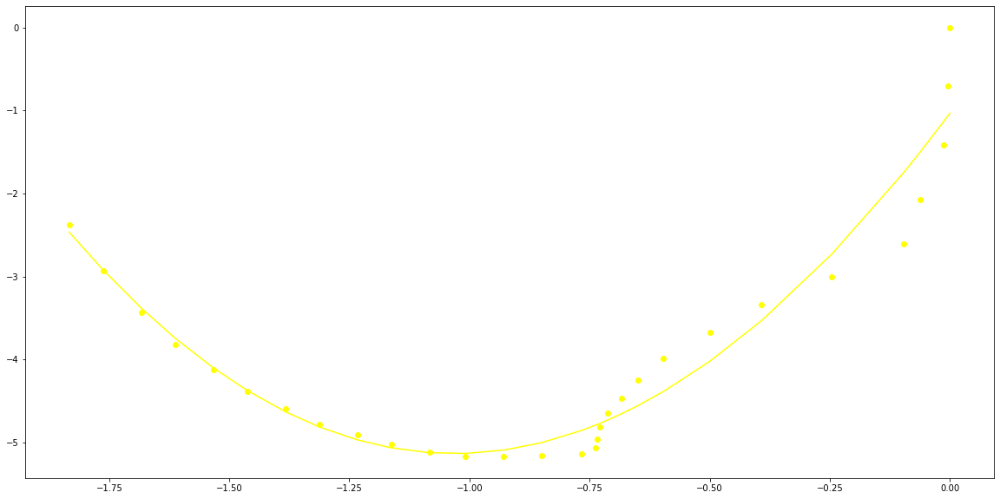

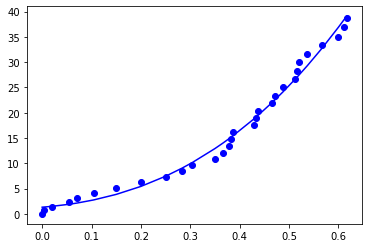

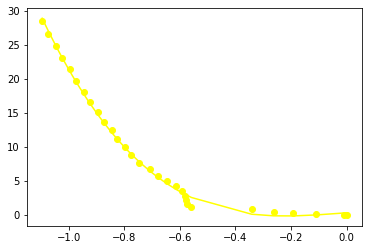

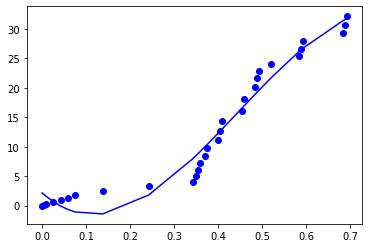

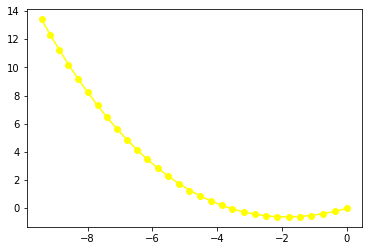

...

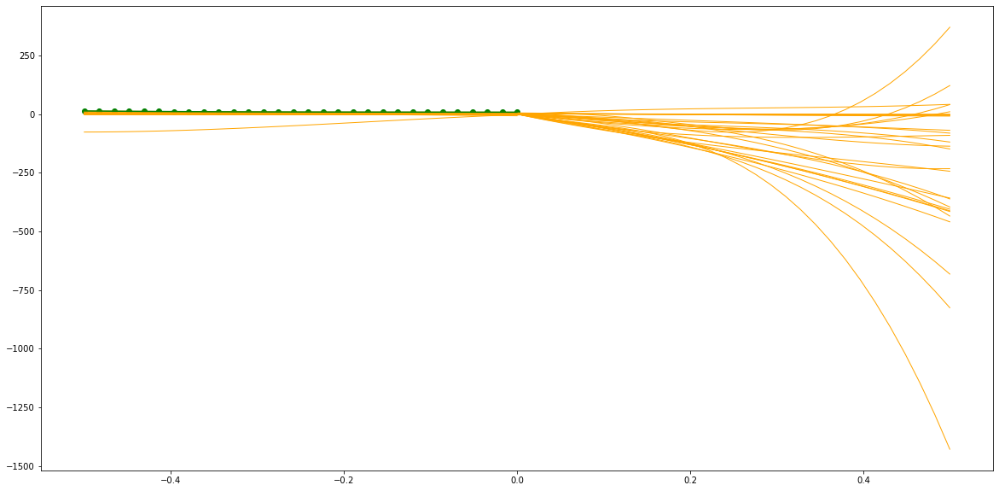

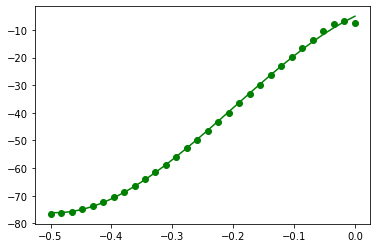

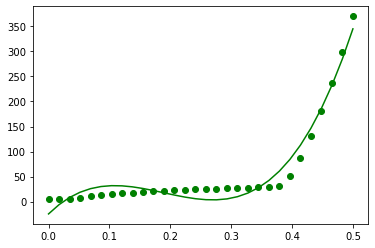

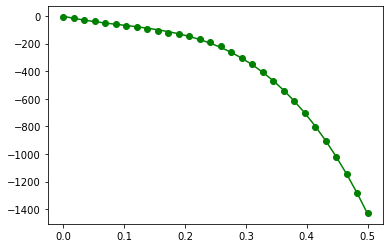

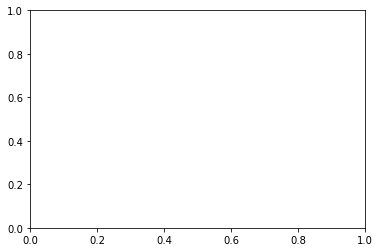

In [20]:
denoised_ground_truth=[2248, 2481, 2806, 2884, 3095, 3560, 3973, 4229, 4750, 4891, 5297, 5436, 5985, 6545, 7234, 7538, 7933, 8356, 9023, 9689, 10149, 10224, 10526, 10795, 11323, 11478, 12362, 13023, 13867, 14081, 14774, 15329, 16096, 16619, 17589, 18417, 19642, 19760, 20013, 20358, 20700, 21035, 21974, 22189, 22709, 23219, 24215, 24683, 25697, 26005, 26640, 26753, 27022, 27315, 27757, 27968, 28322, 28494, 28831, 29093]
pressure_df=pressure_df_denoised
pressure_measure=list(pressure_df[colum_names["pressure"]["measure"]])
pressure_time=list(pressure_df[colum_names["pressure"]["time"]])
identfication_UsePattern=PatternRecognition(point_halfWindow=30)
identfication_UsePattern.learn(pressure_measure,pressure_time,denoised_ground_truth)

In [14]:
len(identfication_UsePattern.breakpoints_forLearn['buildUp']),len(identfication_UsePattern.breakpoints_forLearn['drawDown'])

(32, 28)

---initializing...
---plotting...
detected 32 points as breakpoints
The plot is devided into 25 rows
------row 1-----detected points:[]


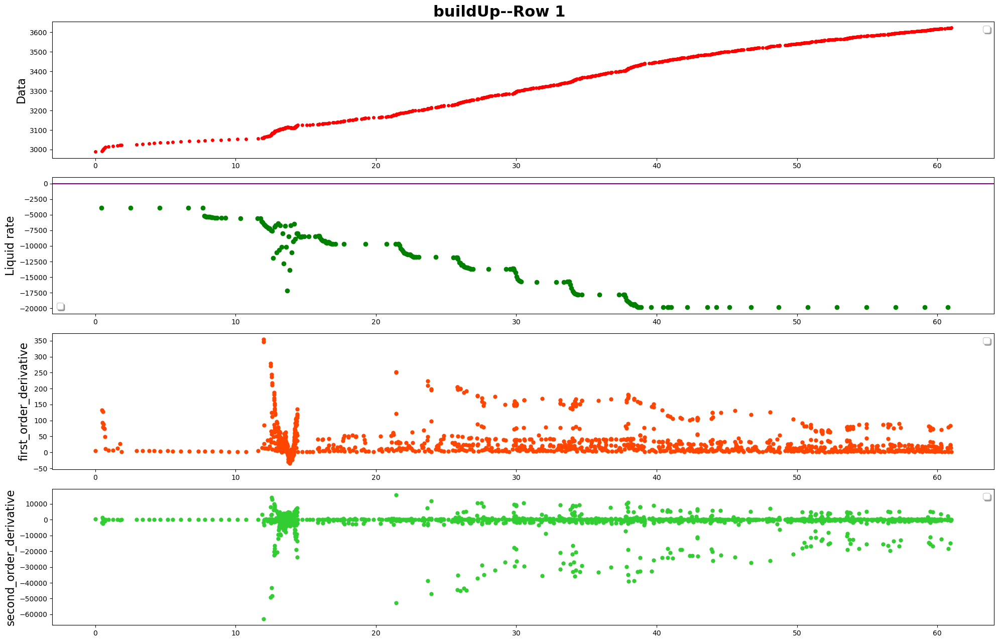

------row 2-----detected points:[]


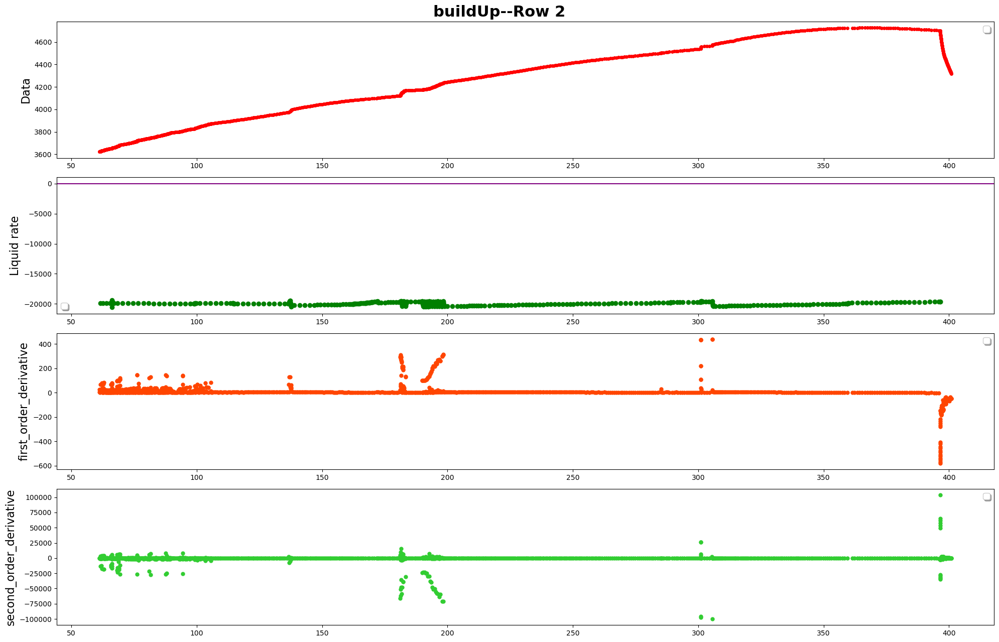

------row 3-----detected points:[2467, 2876, 3561]


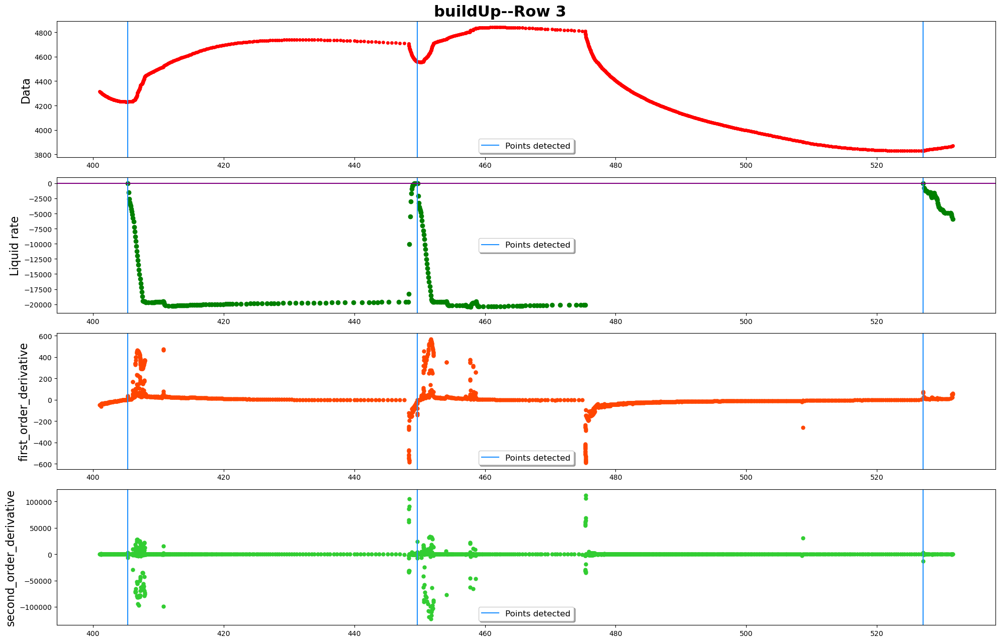

------row 4-----detected points:[4230]


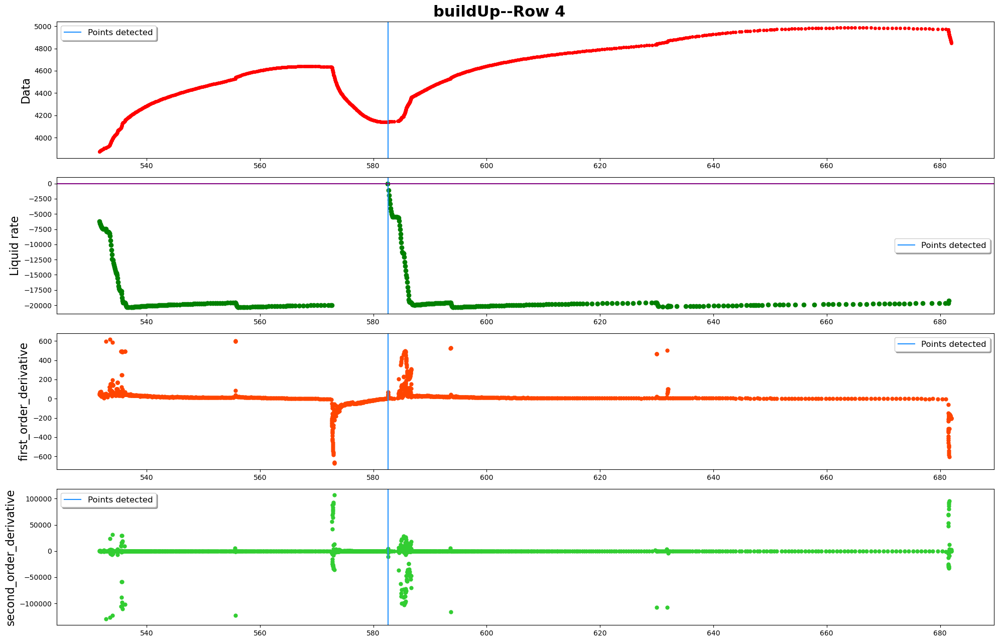

------row 5-----detected points:[4895, 5436]


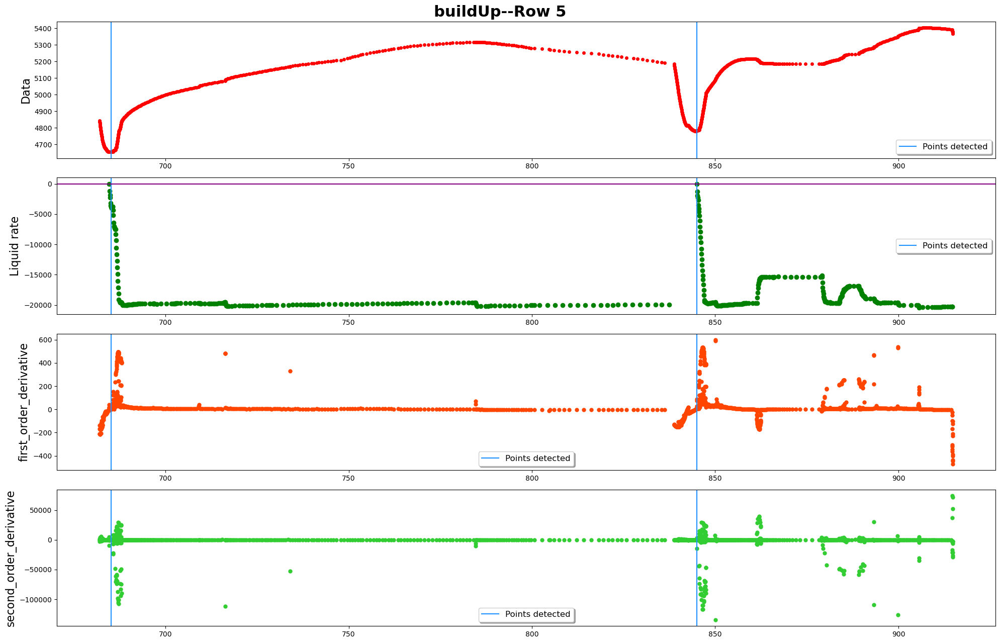

------row 6-----detected points:[6545]


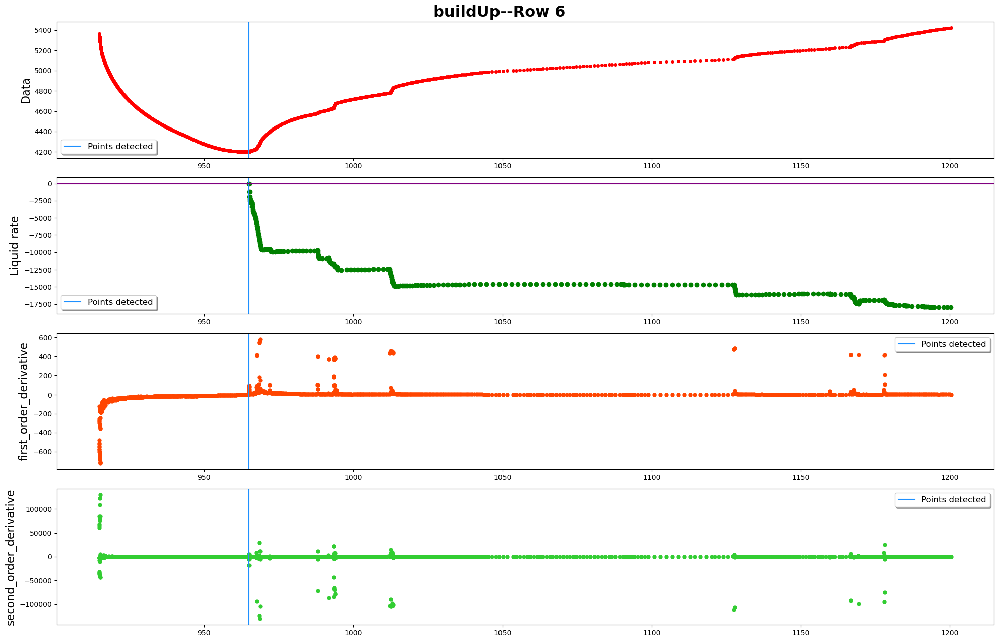

------row 7-----detected points:[7545, 8363]


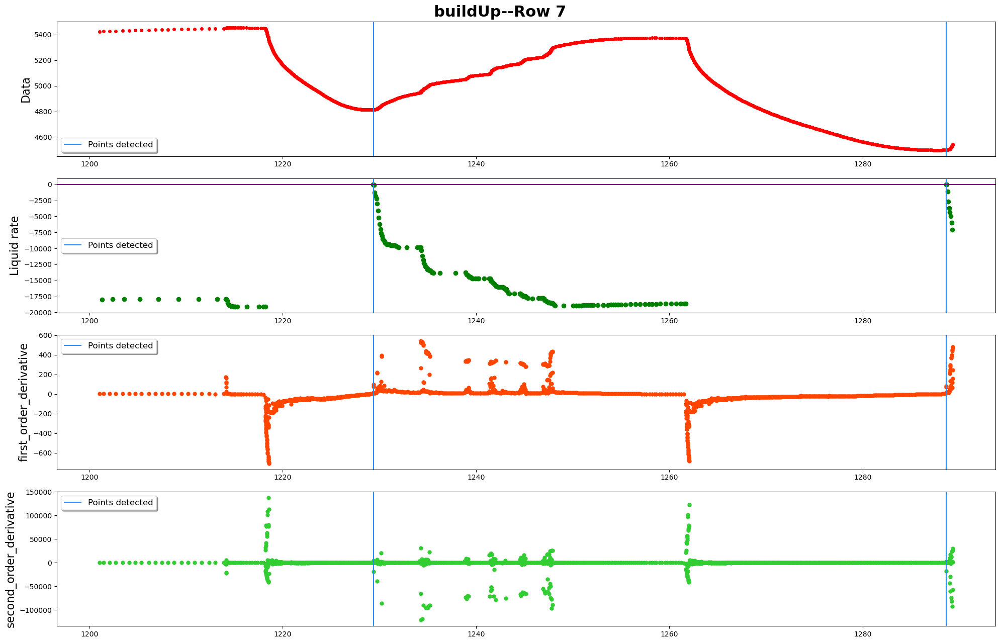

------row 8-----detected points:[]


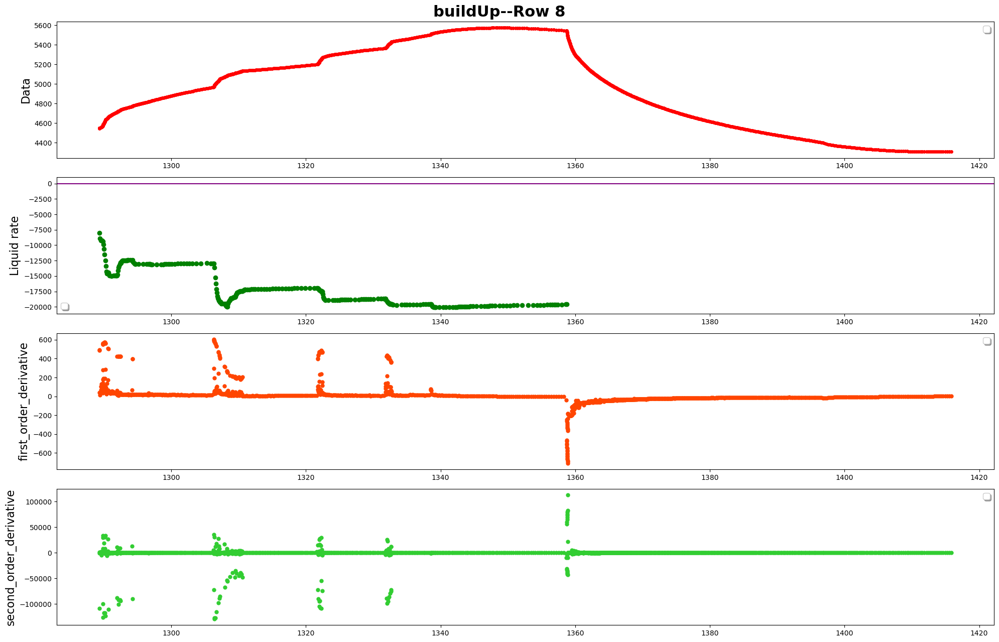

------row 9-----detected points:[9608, 10216]


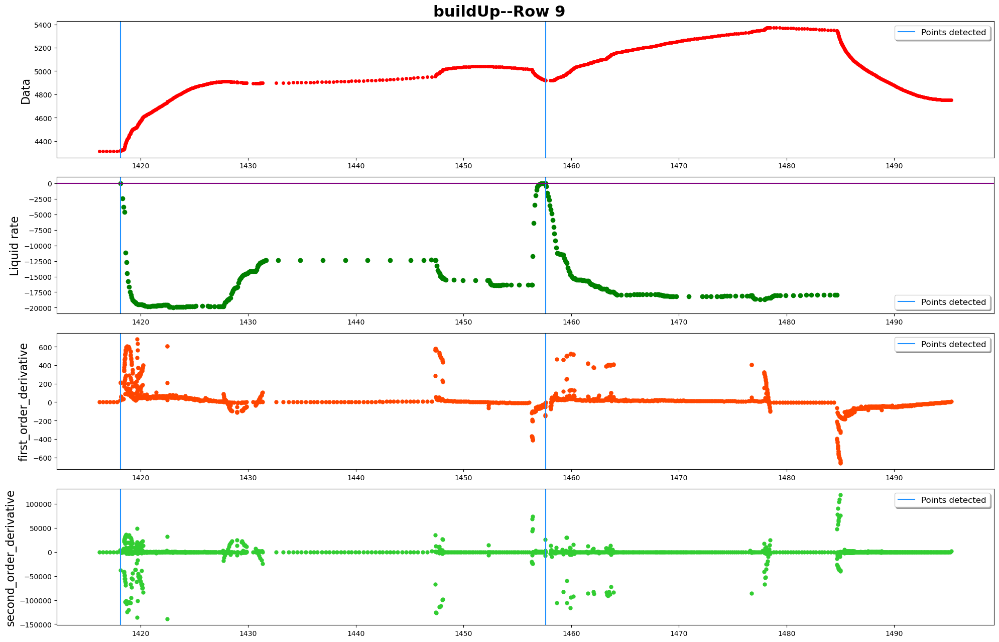

------row 10-----detected points:[10803, 11479]


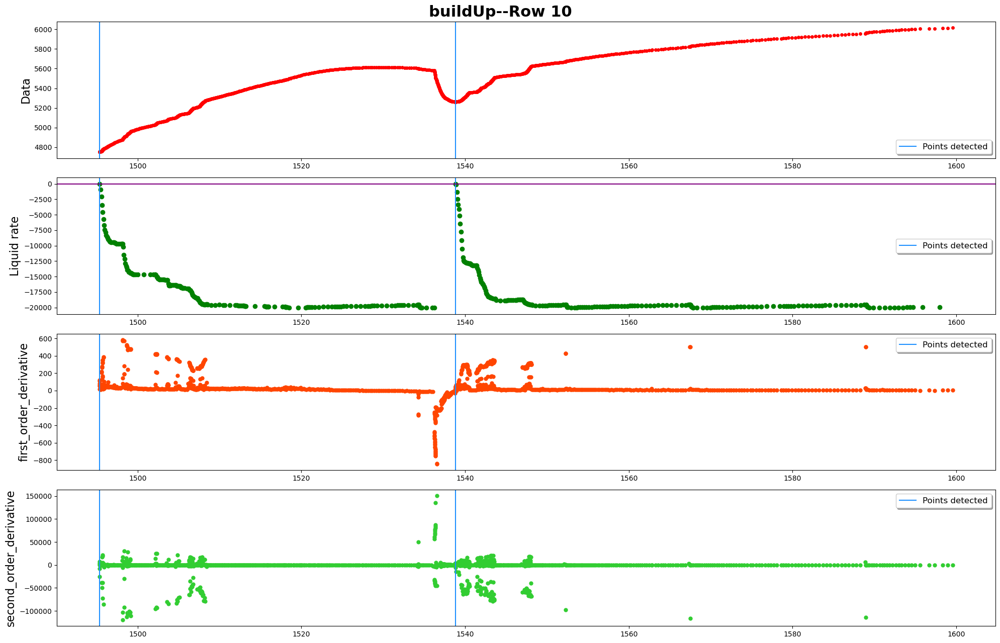

------row 11-----detected points:[13040]


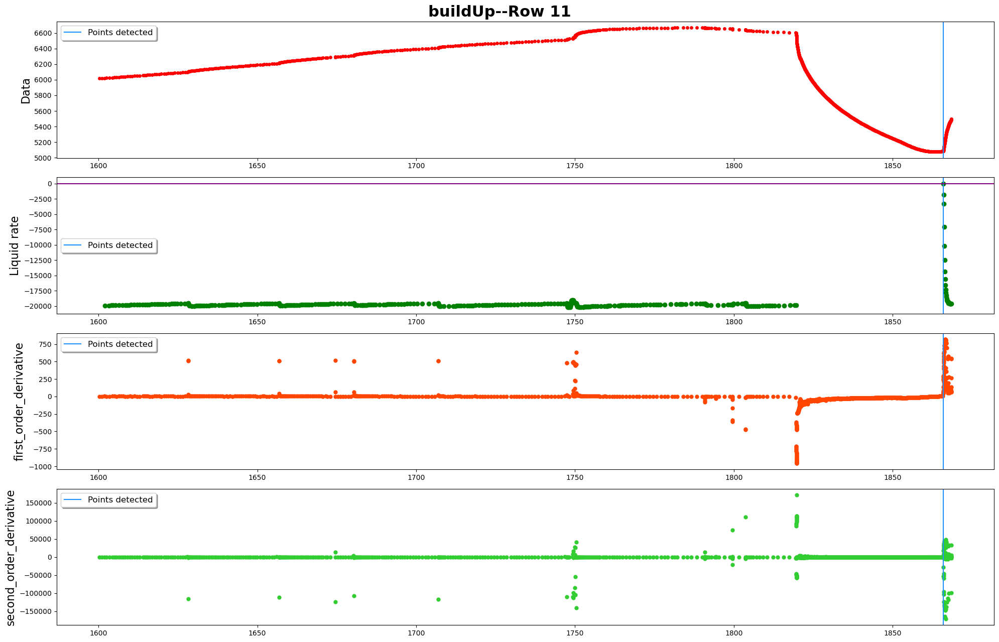

------row 12-----detected points:[14086]


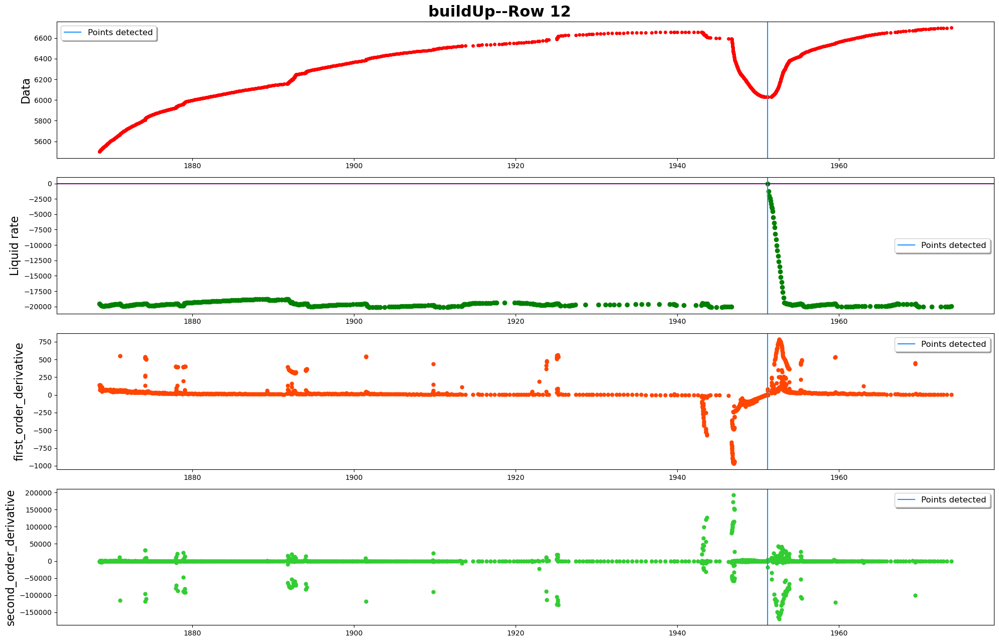

------row 13-----detected points:[15341]


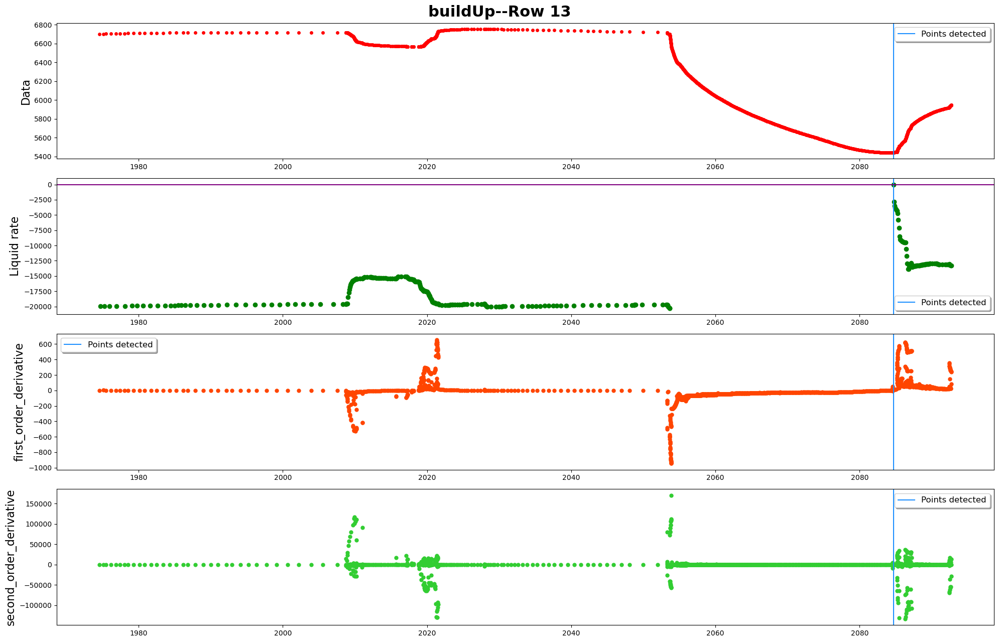

------row 14-----detected points:[16619]


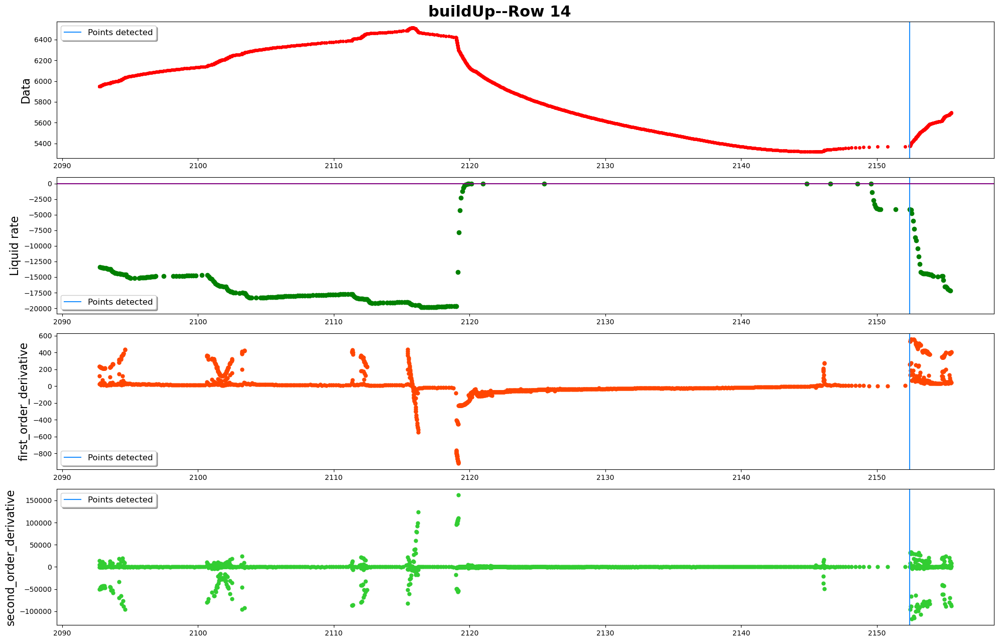

------row 15-----detected points:[]


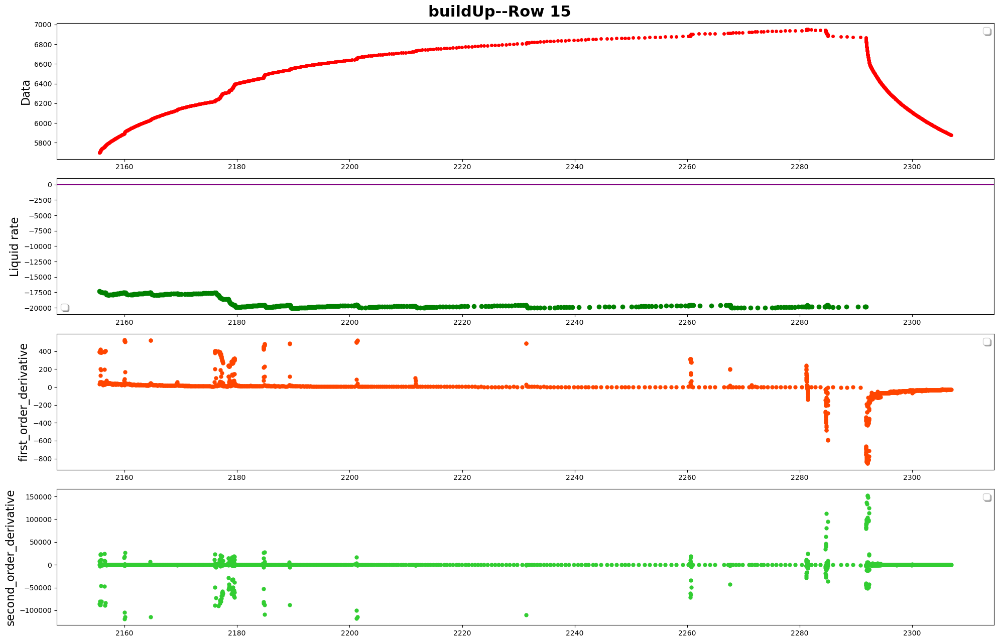

------row 16-----detected points:[18435]


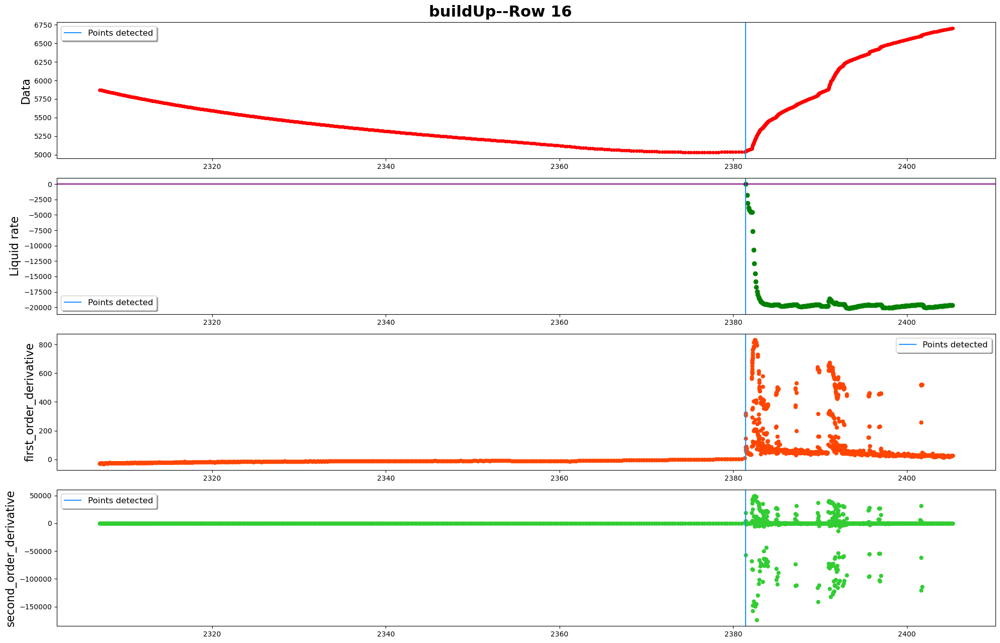

------row 17-----detected points:[19764, 20349]


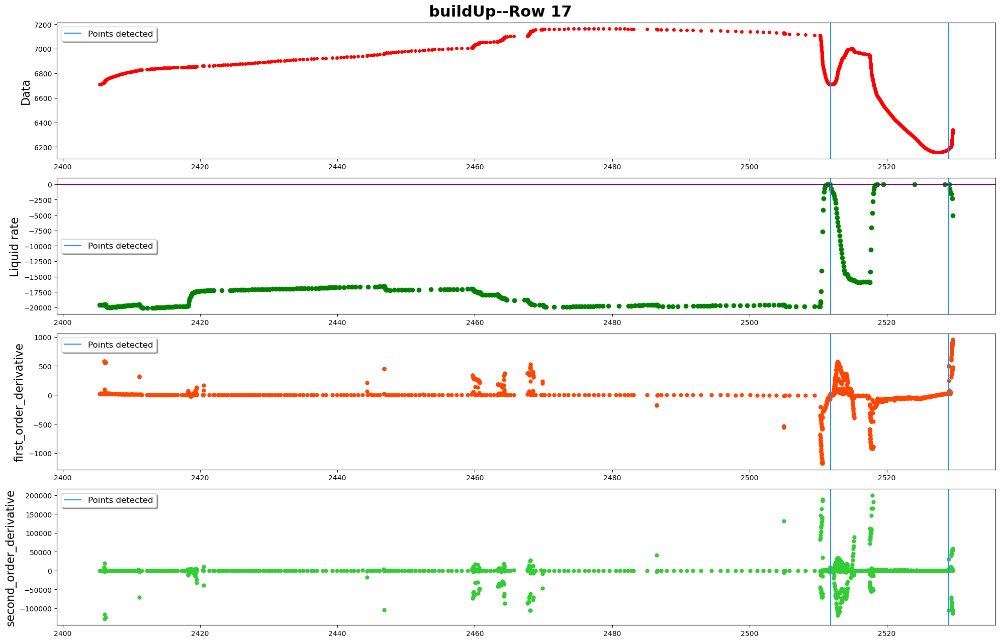

------row 18-----detected points:[21030]


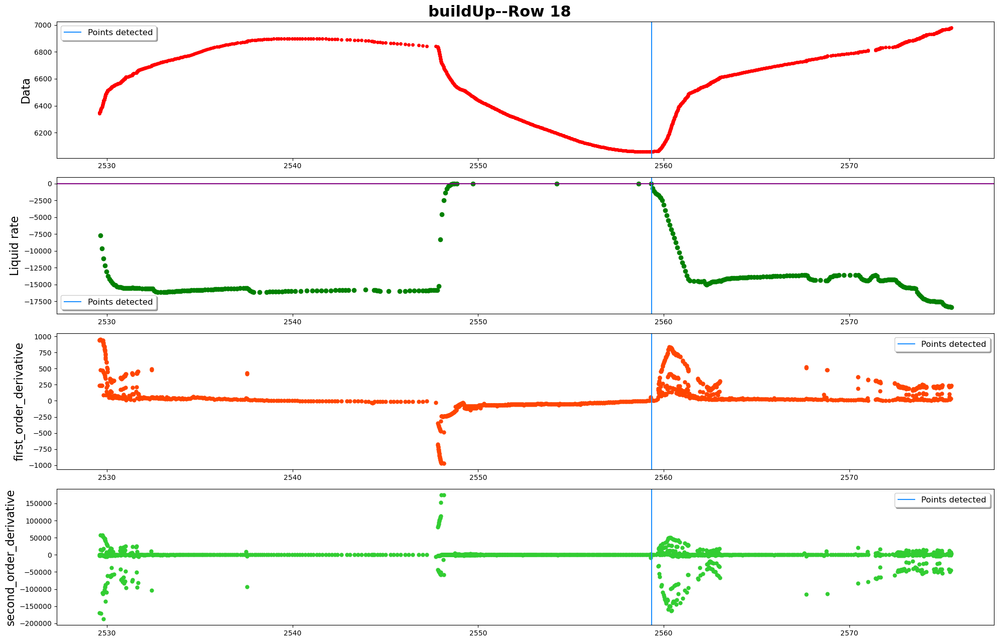

------row 19-----detected points:[22186]


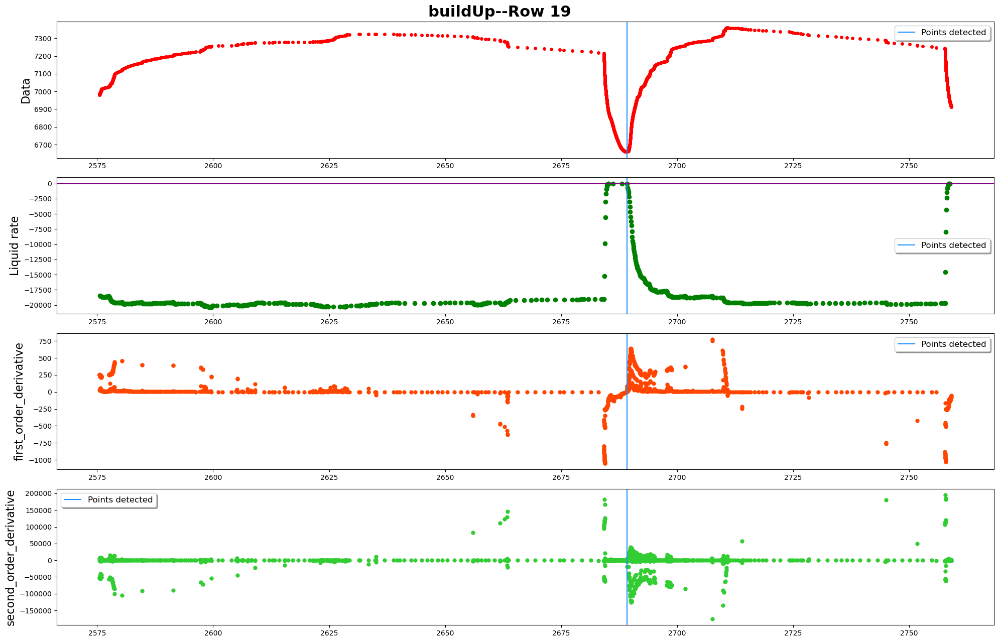

------row 20-----detected points:[23220]


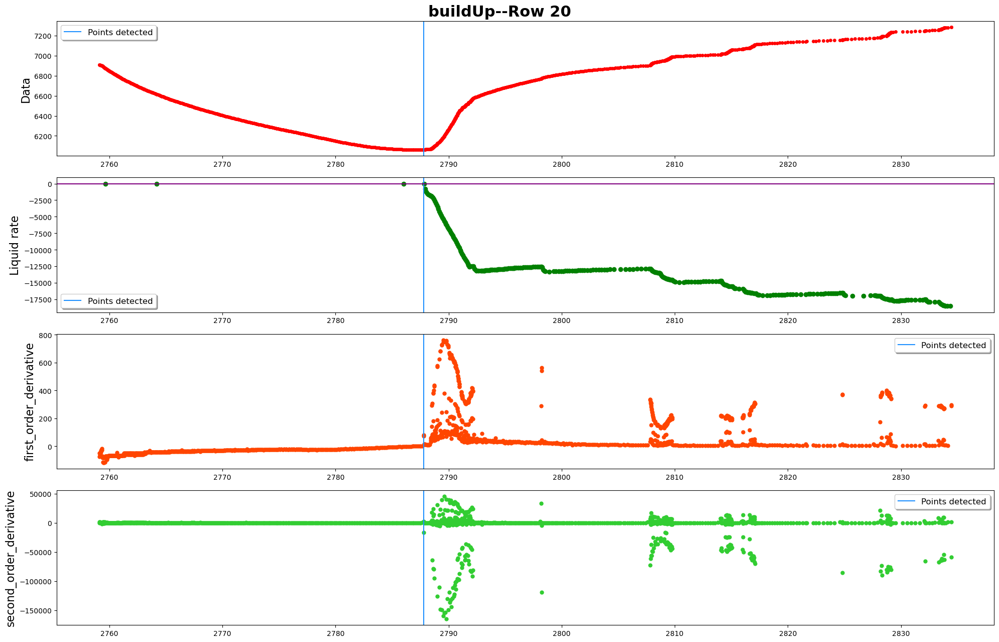

------row 21-----detected points:[24685]


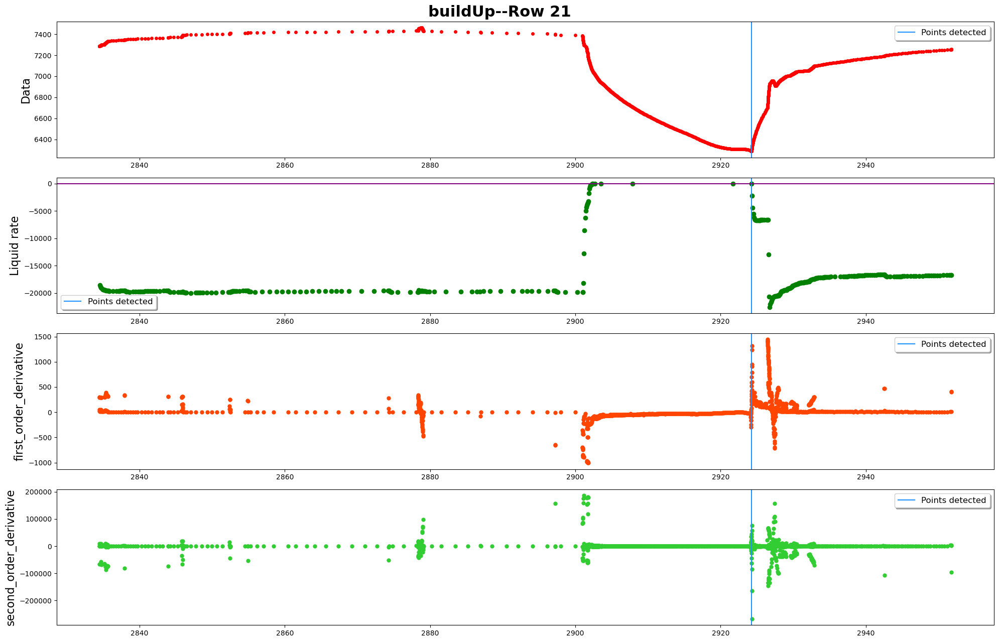

------row 22-----detected points:[26006]


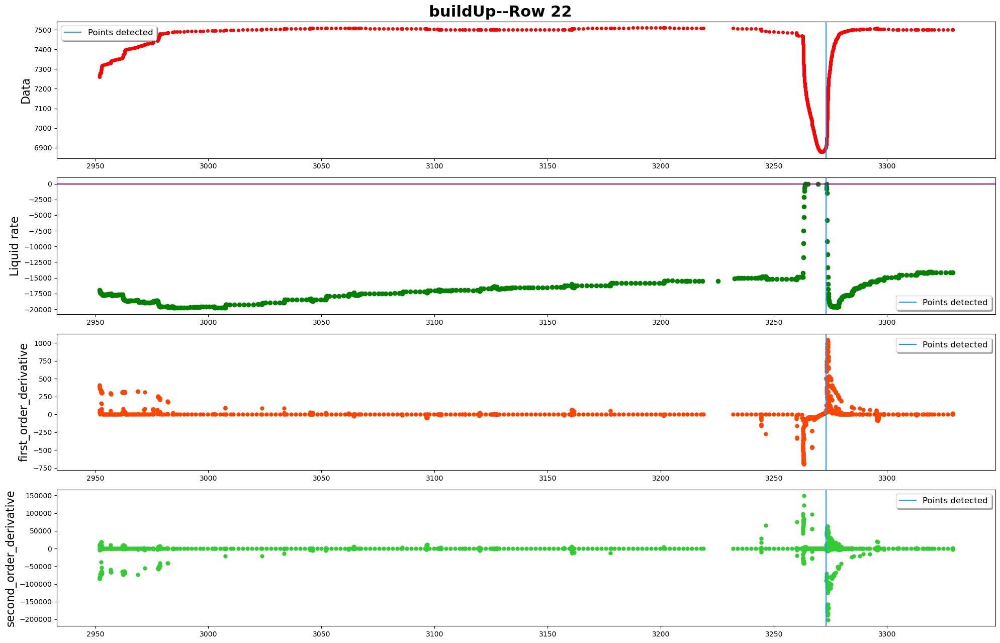

------row 23-----detected points:[26759, 27322]


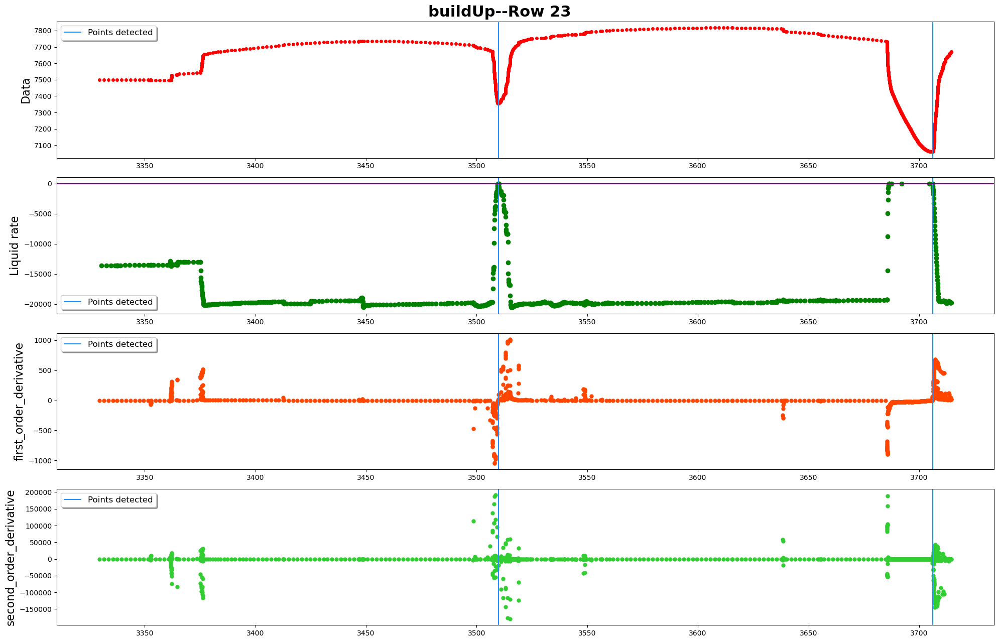

------row 24-----detected points:[27773, 27968, 28322, 28497]


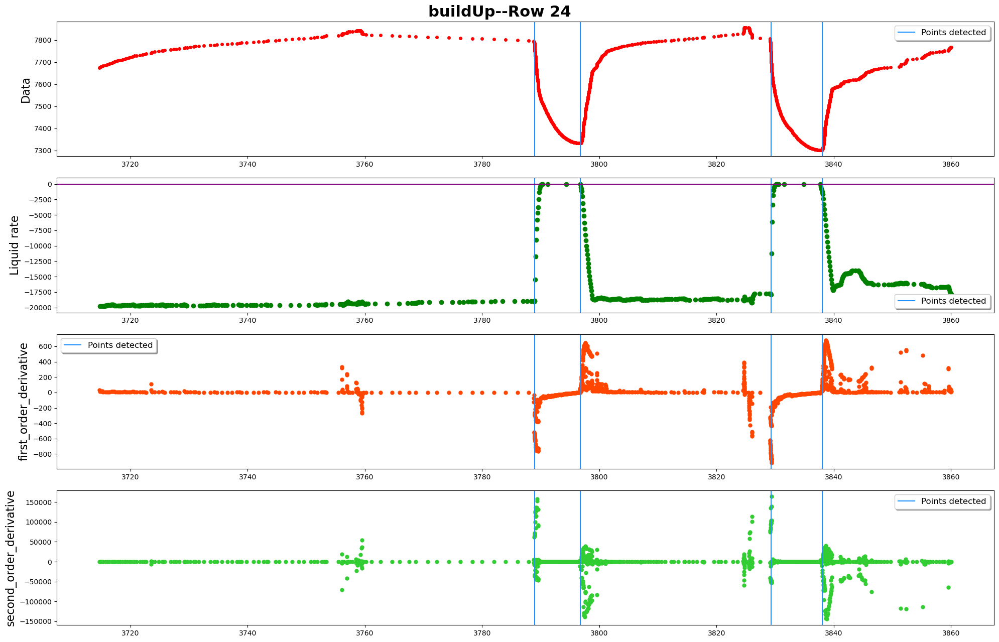

------row 25-----detected points:[29115]


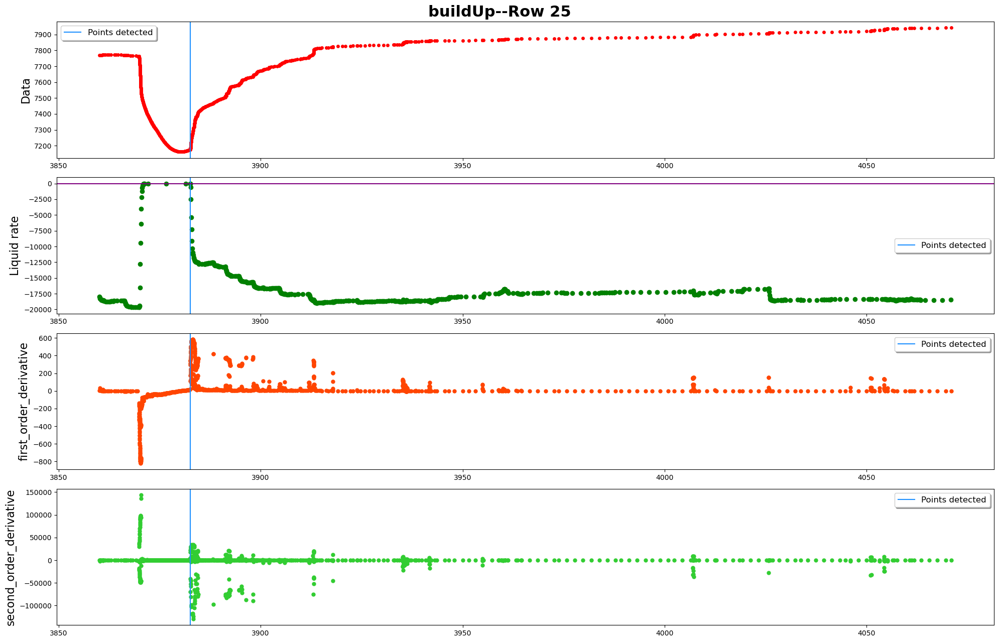

In [15]:
pressure_df=processed_data_denoised.pressure_df
rate_df=processed_data_denoised.rate_df
data_inOneRow=1200
filename_toSave=""
plot_name="buildUp"
plot_whole=False
plot_details=True
plot_statistics=False
PlotNSave(pressure_df,
          rate_df,
          identfication_UsePattern.breakpoints_forLearn['buildUp'],
          [],
          data_inOneRow,
          plot_name,
          filename_toSave,
          plot_statistics,
          plot_whole,
          plot_details,
          colum_names)

---initializing...
---plotting...
detected 29 points as breakpoints
The plot is devided into 25 rows
------row 1-----detected points:[]


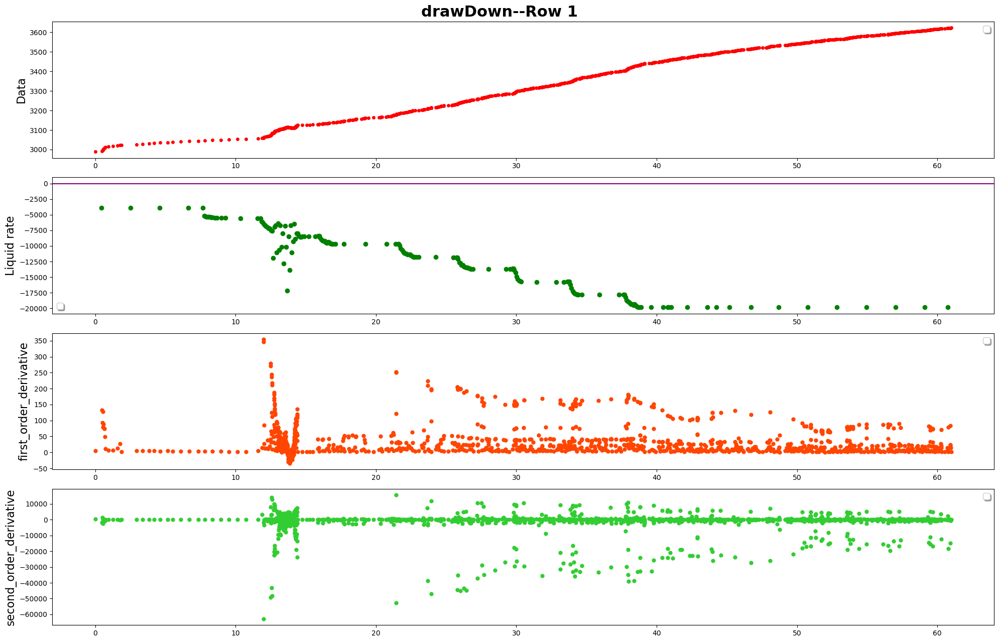

------row 2-----detected points:[2249]


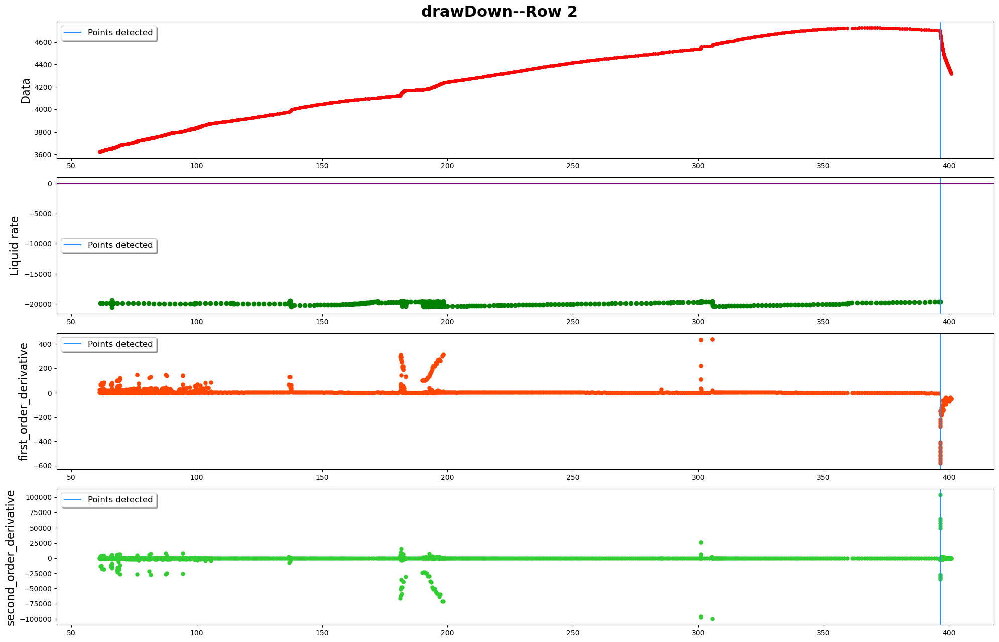

------row 3-----detected points:[2805, 3100]


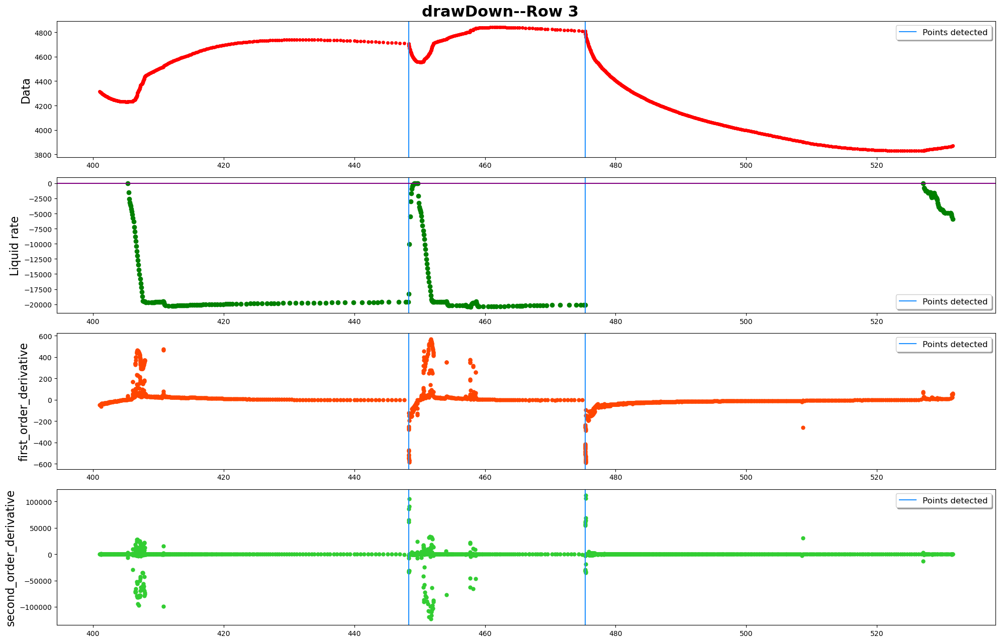

------row 4-----detected points:[3994, 4753]


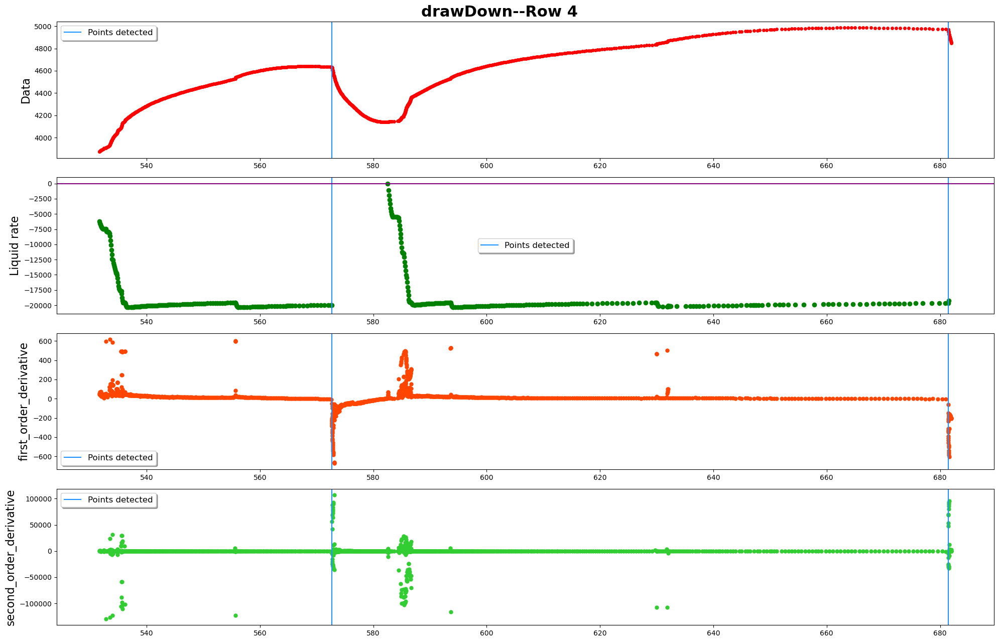

------row 5-----detected points:[5297, 5985]


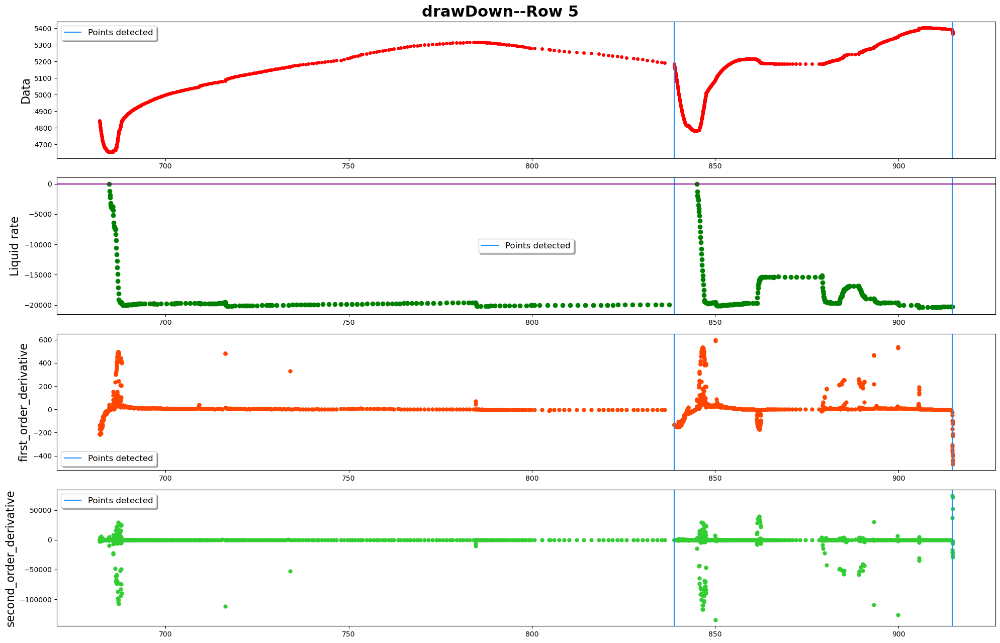

------row 6-----detected points:[]


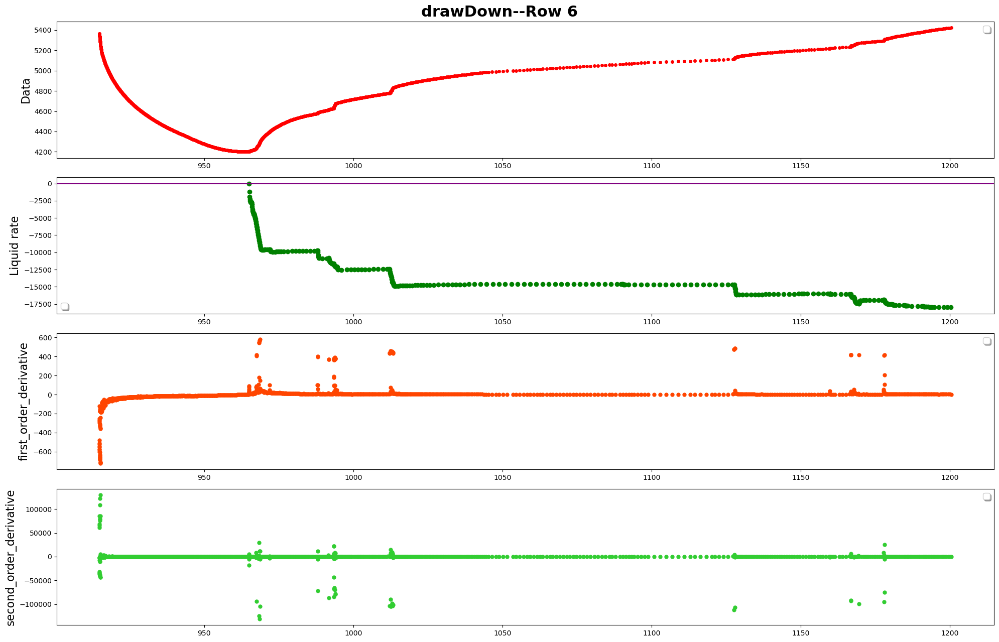

------row 7-----detected points:[7249, 7946]


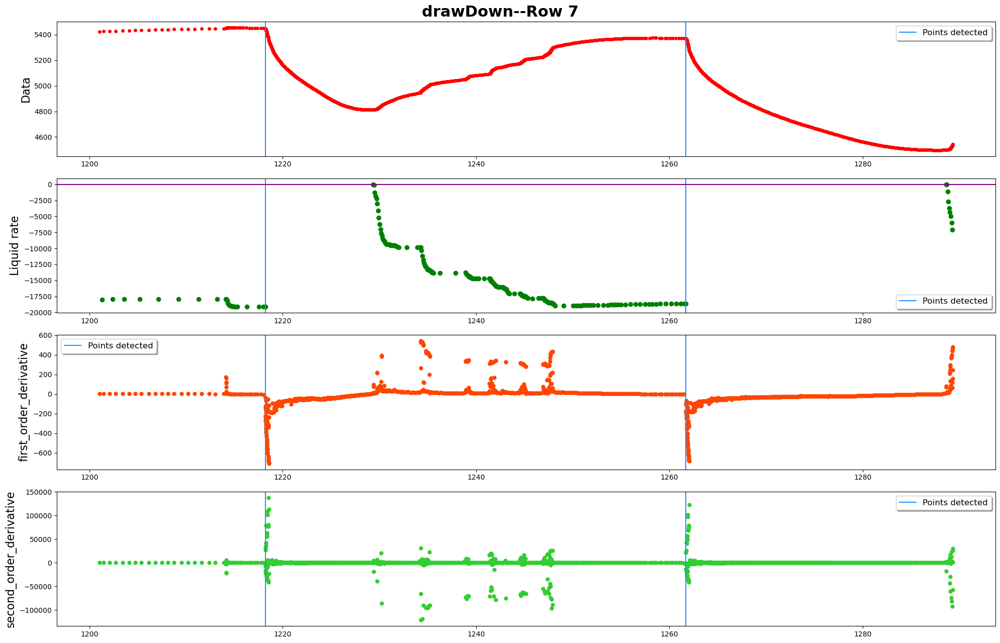

------row 8-----detected points:[9025]


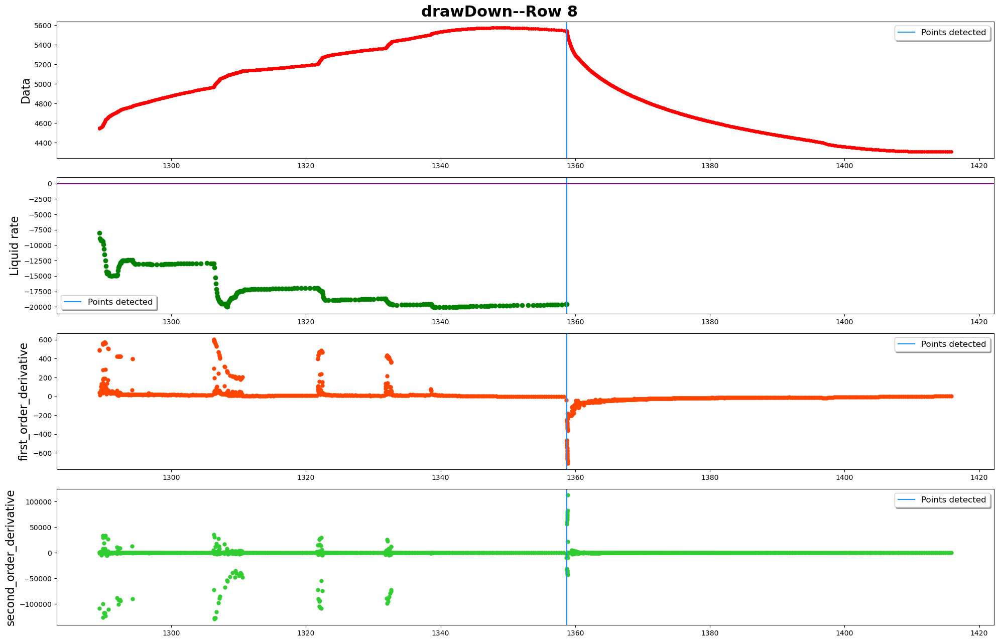

------row 9-----detected points:[10149, 10528]


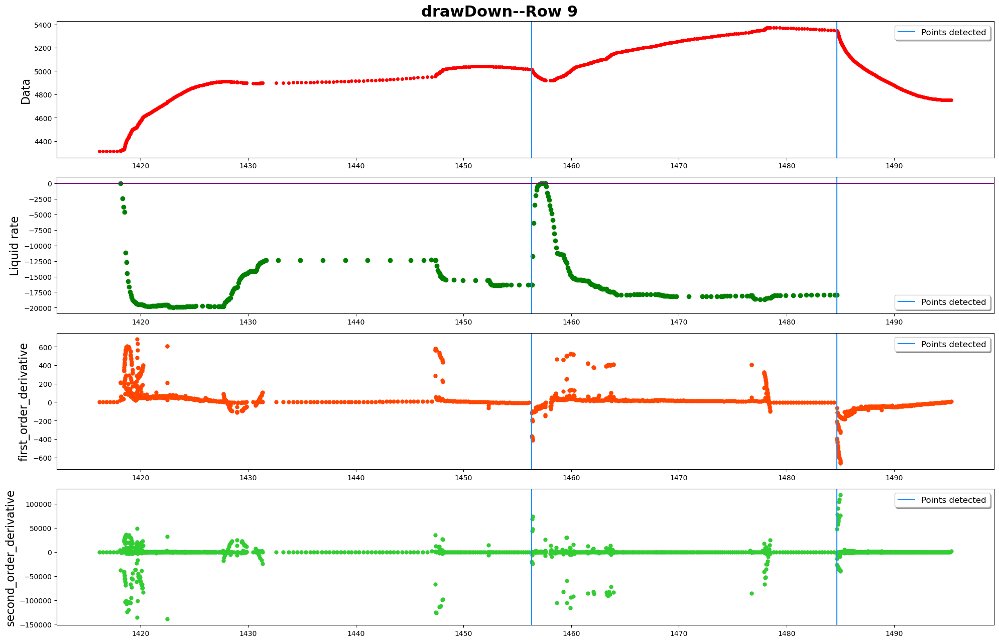

------row 10-----detected points:[11340]


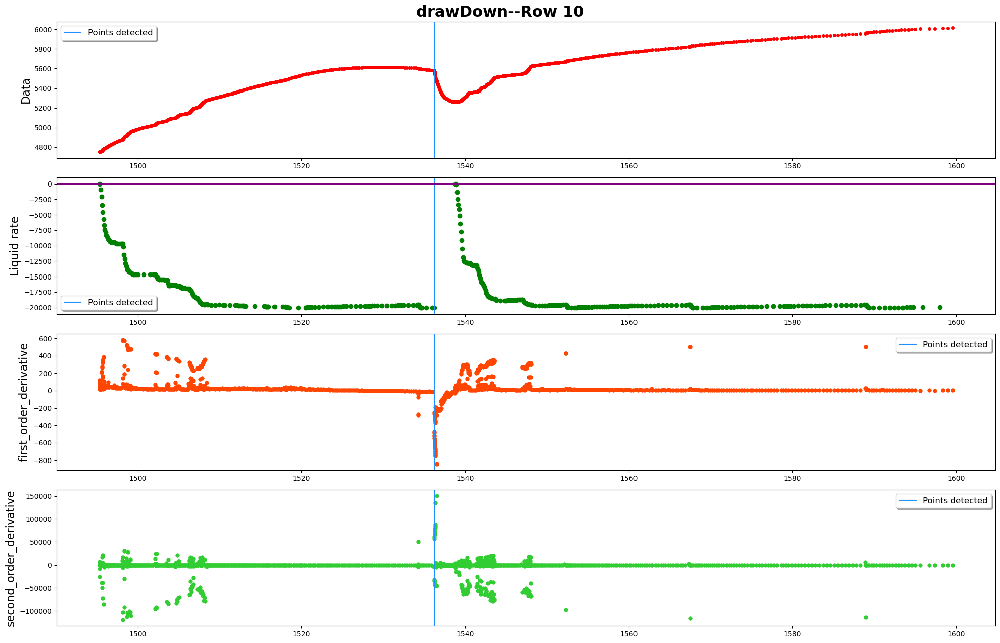

------row 11-----detected points:[12363]


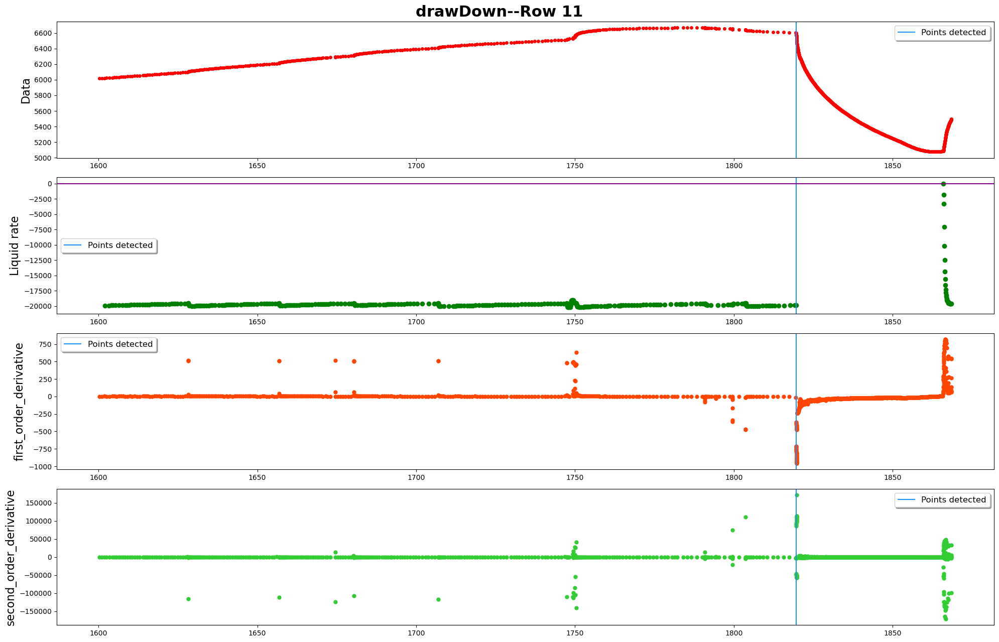

------row 12-----detected points:[13868]


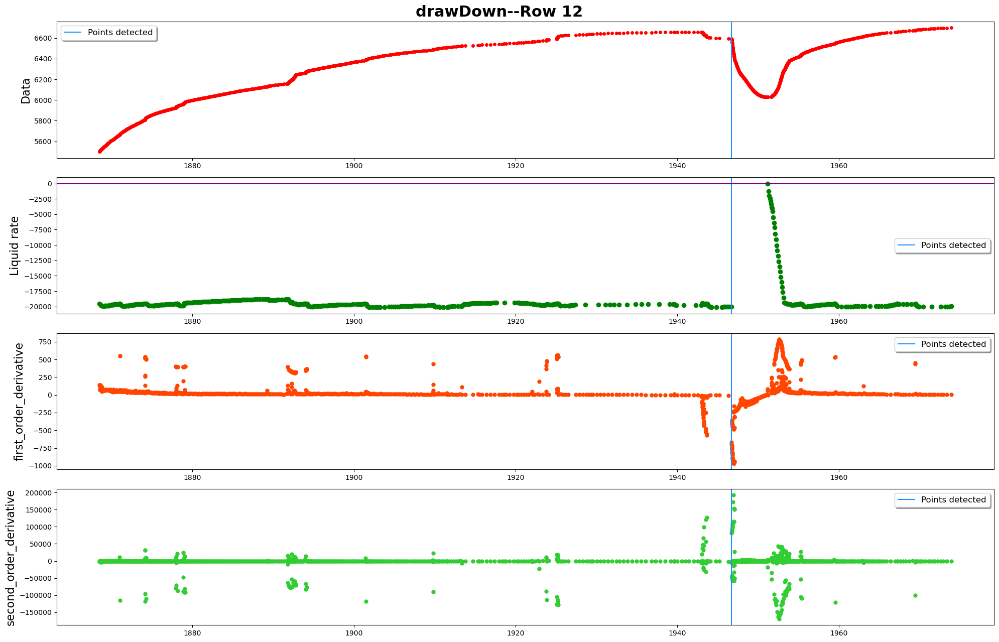

------row 13-----detected points:[14774]


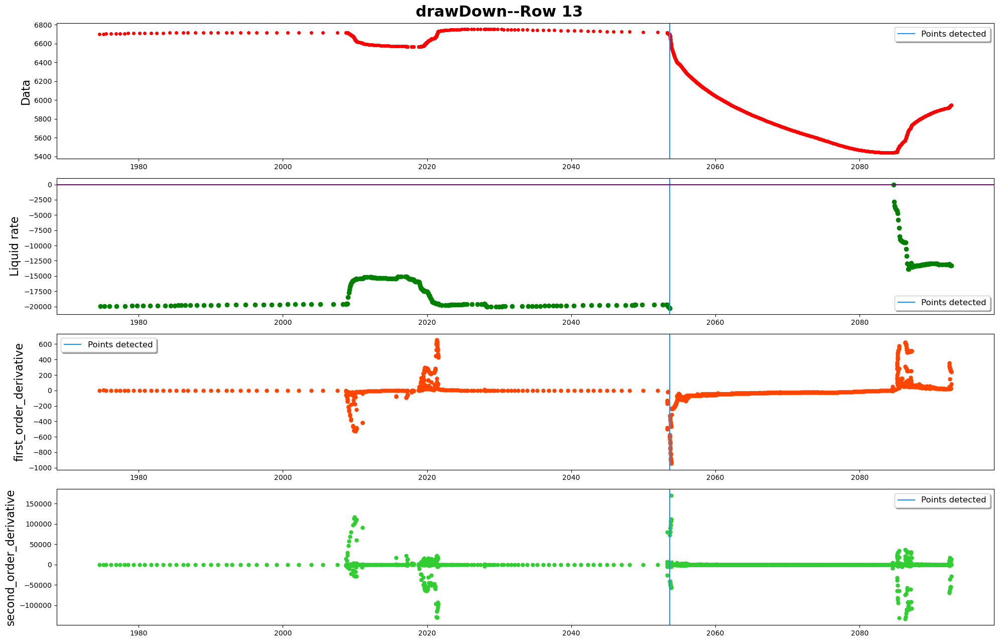

------row 14-----detected points:[16098]


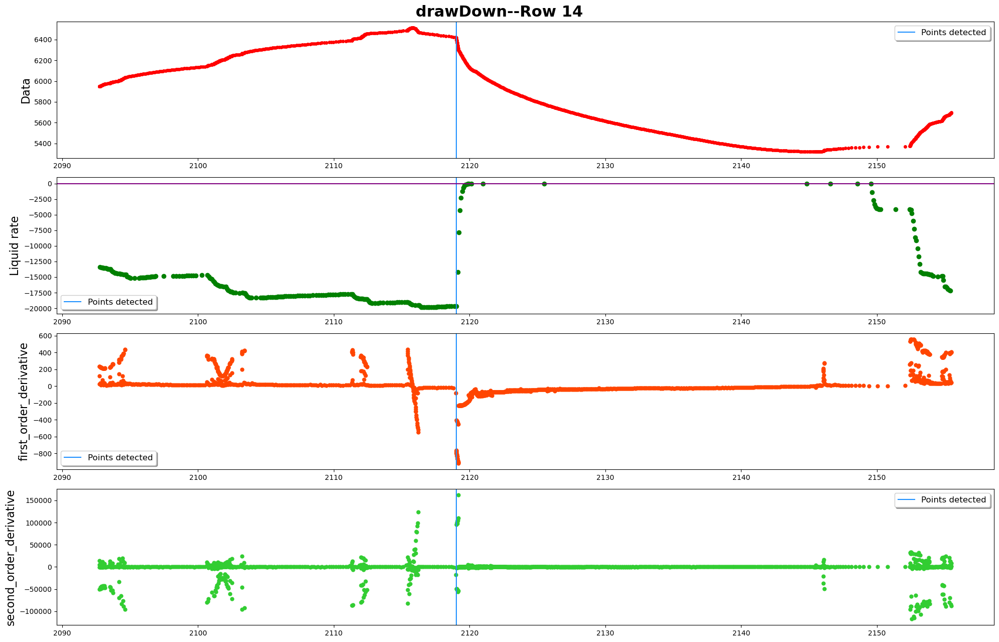

------row 15-----detected points:[17590]


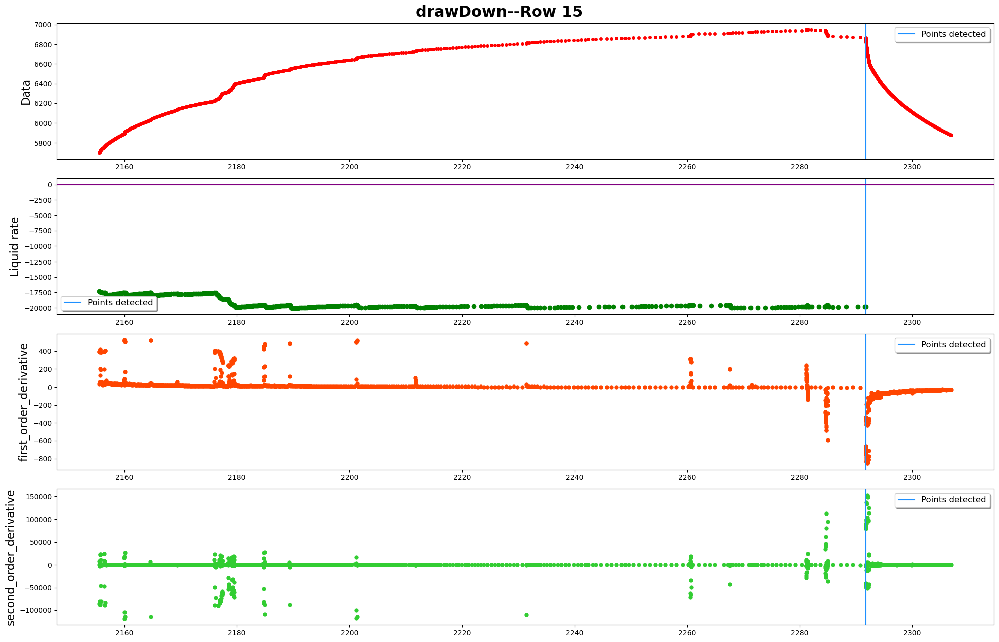

------row 16-----detected points:[]


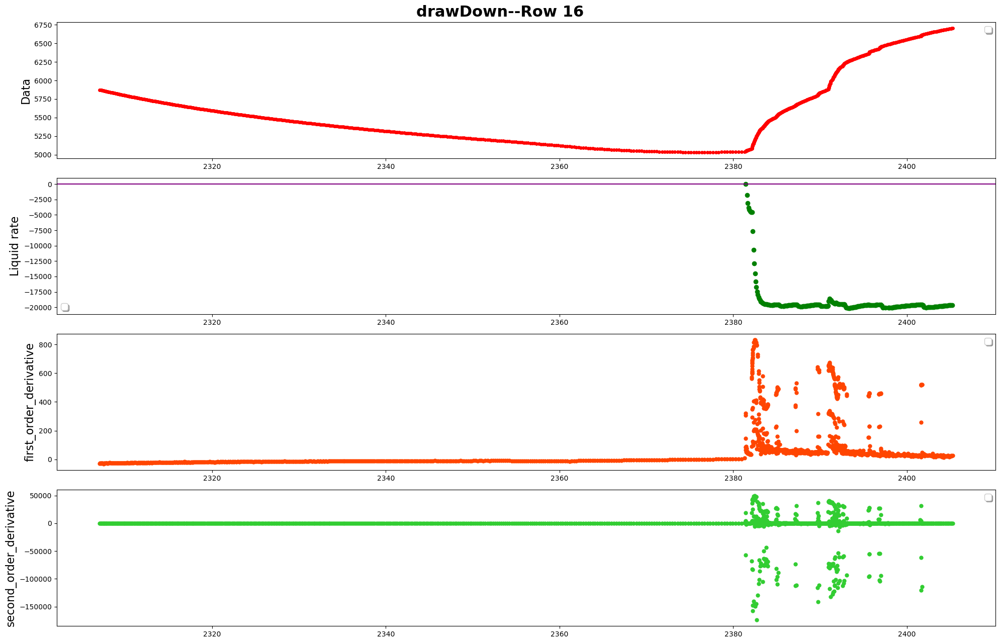

------row 17-----detected points:[19643, 20021]


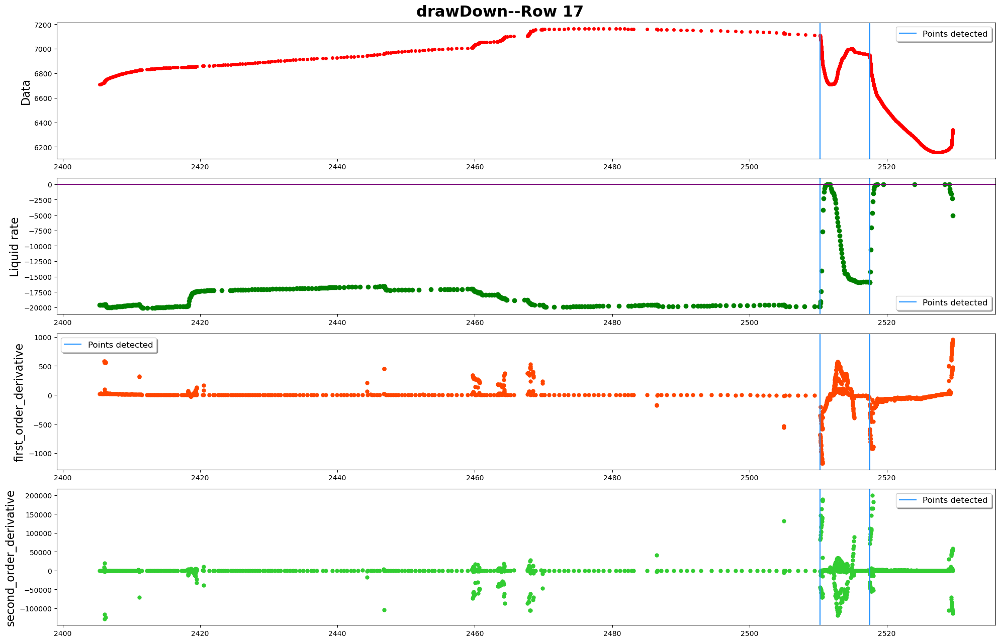

------row 18-----detected points:[20701]


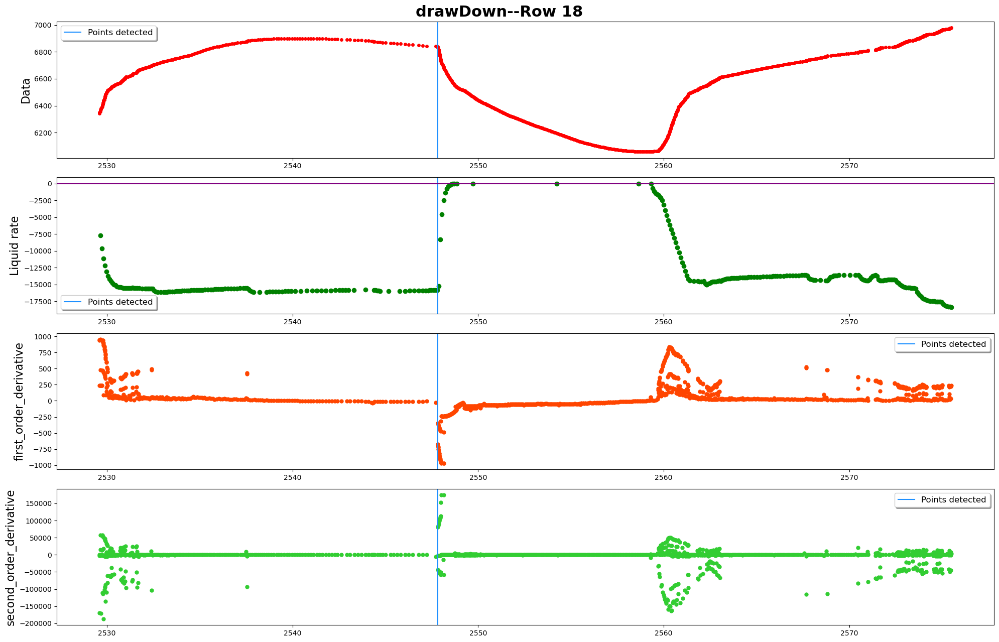

------row 19-----detected points:[21974, 22710]


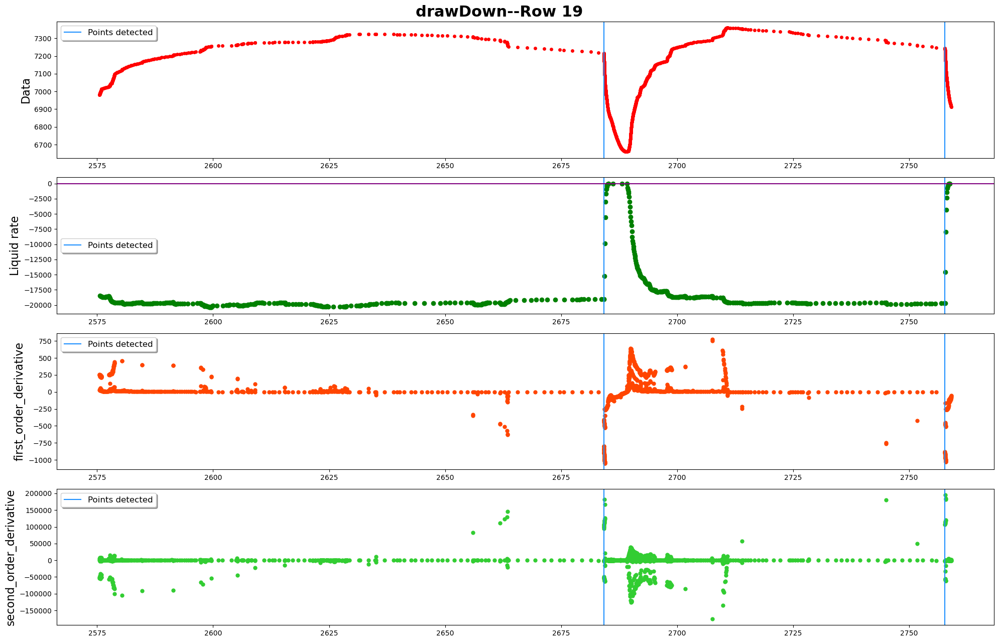

------row 20-----detected points:[]


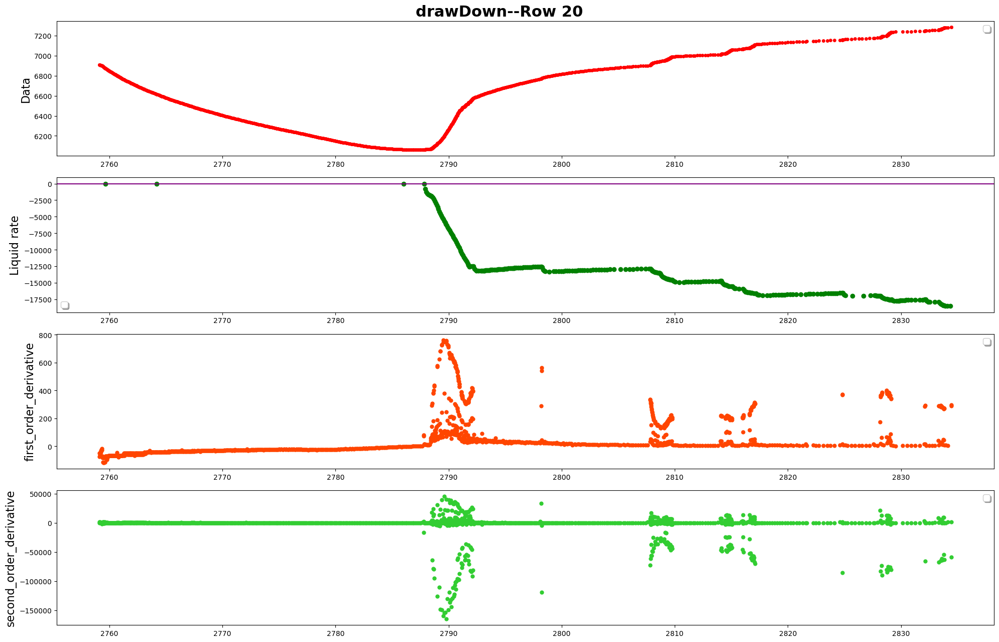

------row 21-----detected points:[24215]


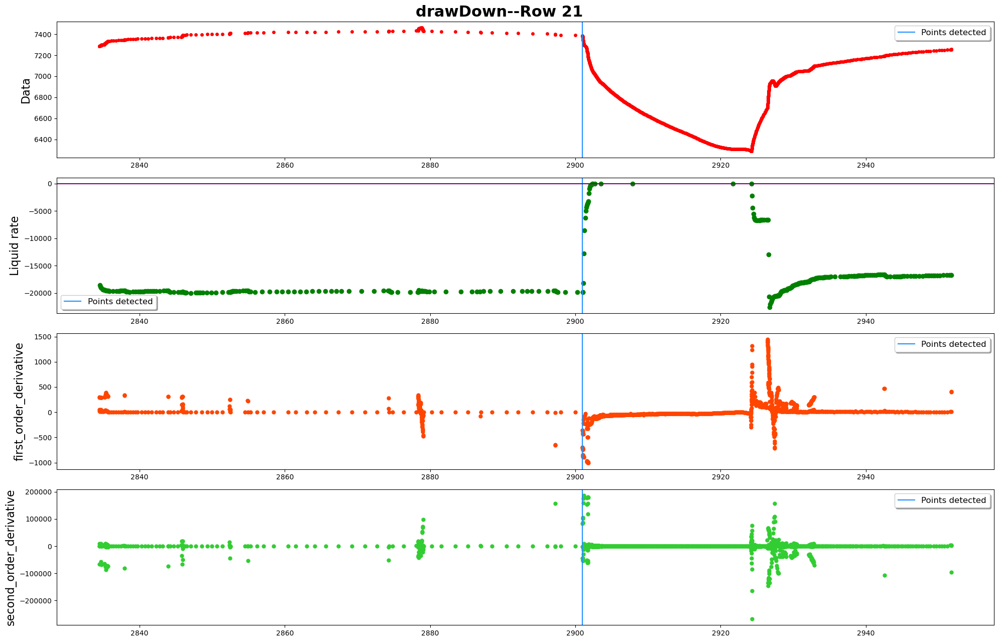

------row 22-----detected points:[25717]


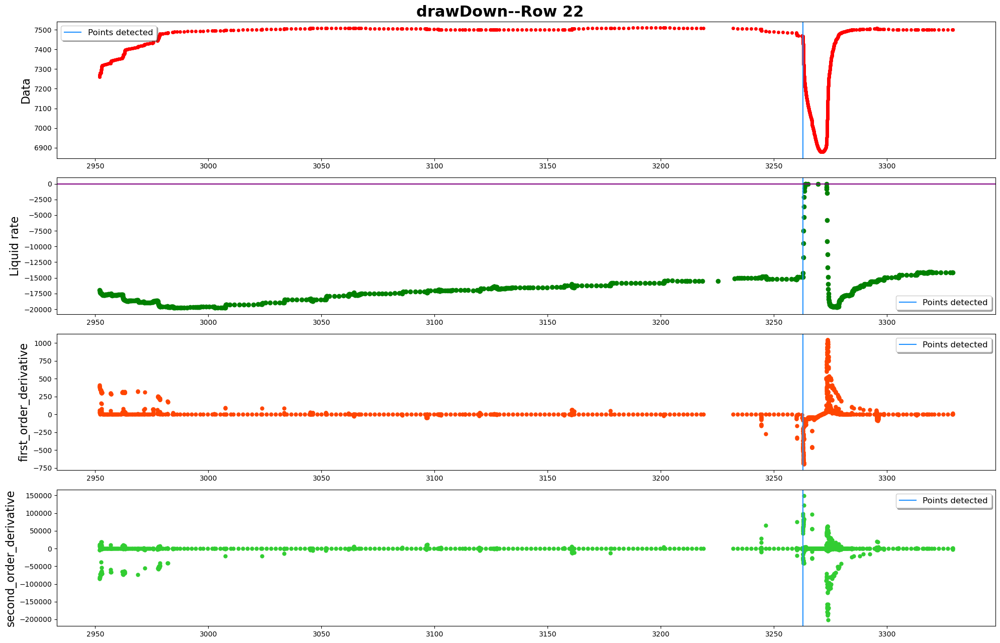

------row 23-----detected points:[26656, 27023]


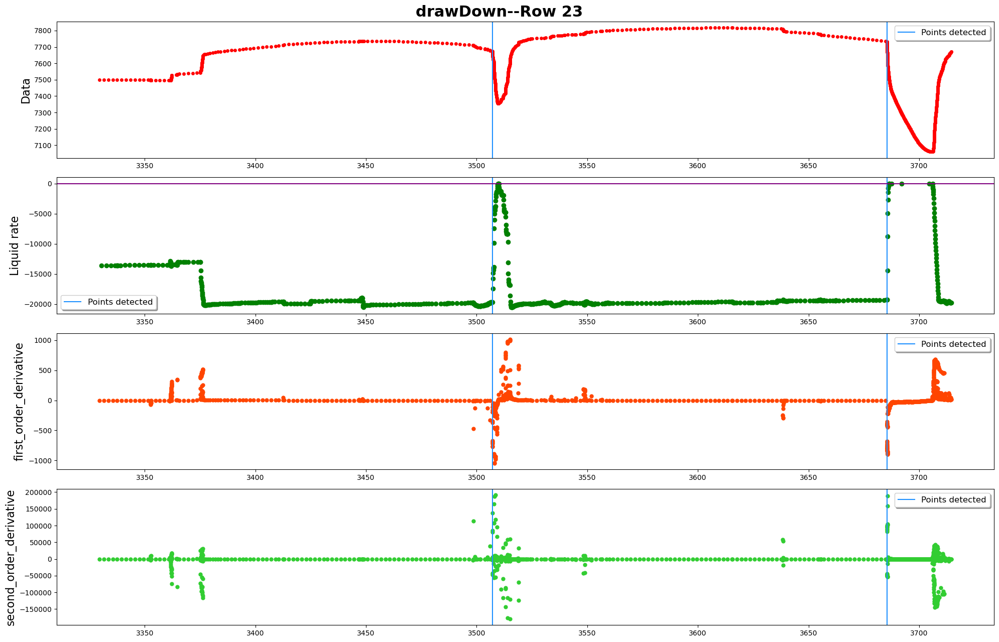

------row 24-----detected points:[28322]


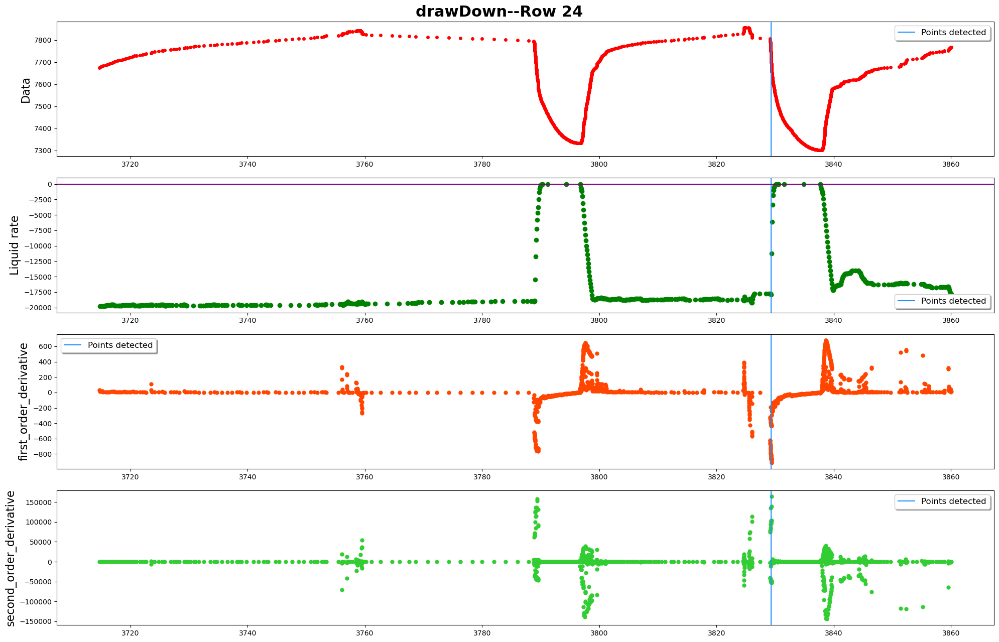

------row 25-----detected points:[28832]


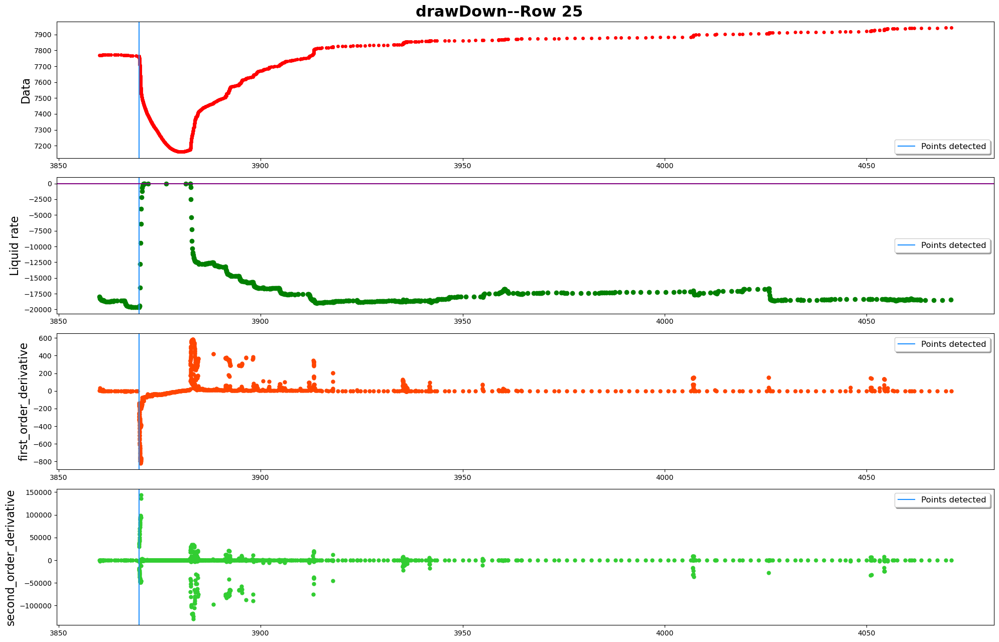

In [17]:
pressure_df=processed_data_denoised.pressure_df
rate_df=processed_data_denoised.rate_df
data_inOneRow=1200
filename_toSave=""
plot_name="drawDown"
plot_whole=False
plot_details=True
plot_statistics=False
PlotNSave(pressure_df,
          rate_df,
          identfication_UsePattern.breakpoints_forLearn['drawDown'],
          [],
          data_inOneRow,
          plot_name,
          filename_toSave,
          plot_statistics,
          plot_whole,
          plot_details,
          colum_names)

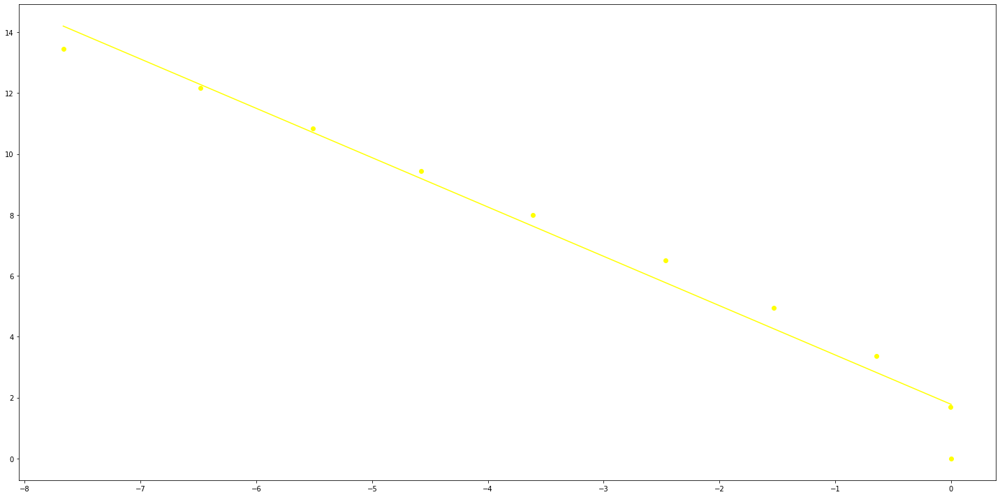

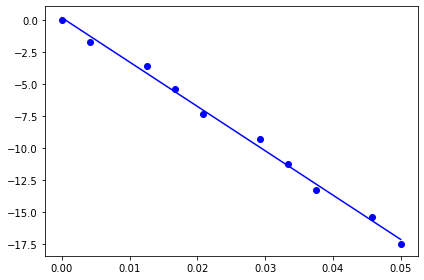

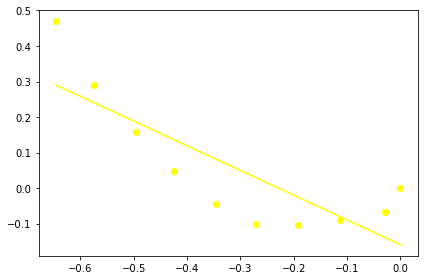

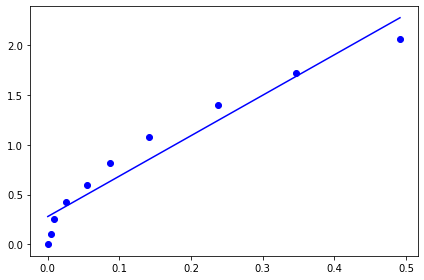

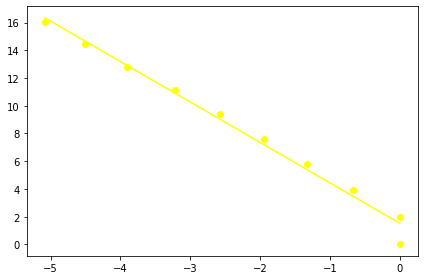

...

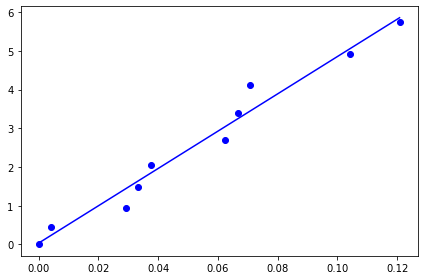

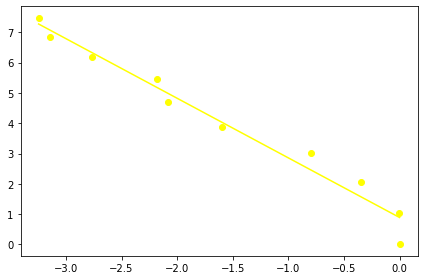

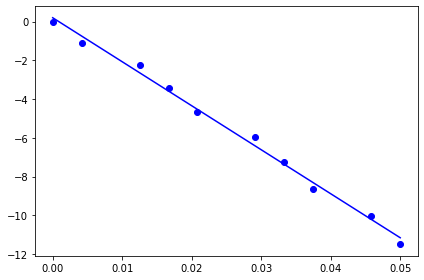

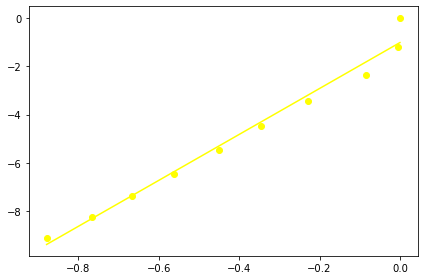

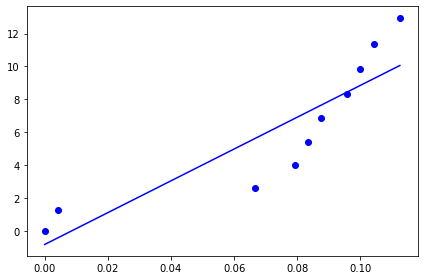

----ground_truth_buildUp,ground_truth_drawDown [2467, 2876, 3561, 4230, 4895, 5436, 6545, 7545, 8363, 9608, 10216, 10803, 11479, 13040, 14086, 15341, 16619, 18435, 19764, 20349, 21030, 22186, 23220, 24685, 26006, 26759, 27322, 27773, 27968, 28497, 29115] [2249, 2805, 3100, 3994, 4753, 5297, 5985, 7249, 7946, 9025, 10149, 10528, 11340, 12363, 13868, 14774, 16098, 17590, 19643, 20021, 20701, 21974, 22710, 24215, 25717, 26656, 27023, 28322, 28832]


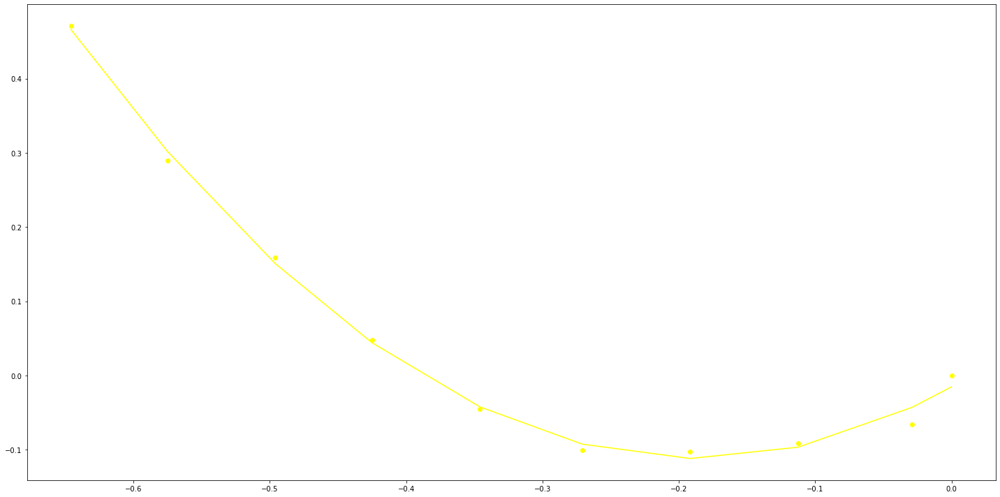

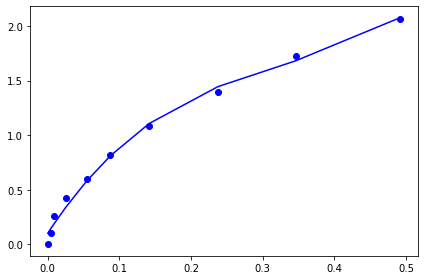

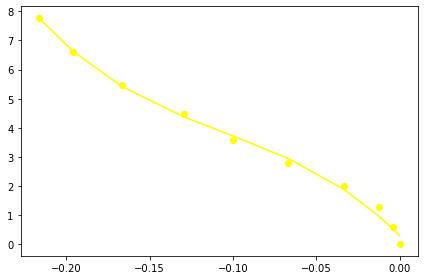

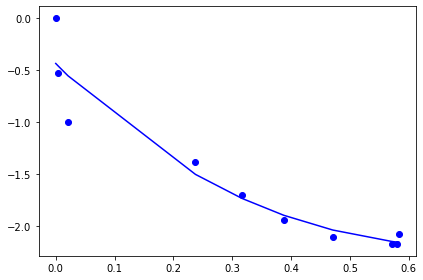

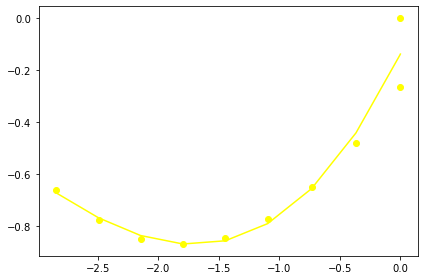

...

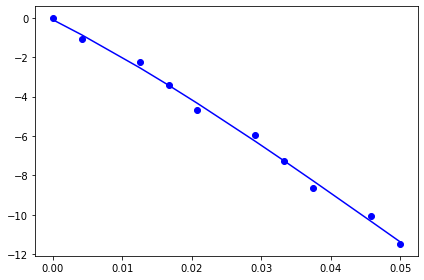

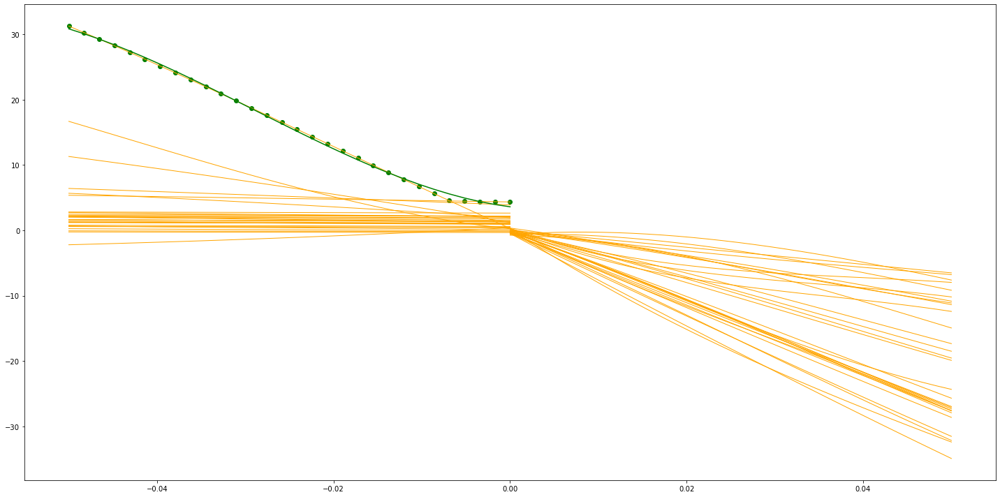

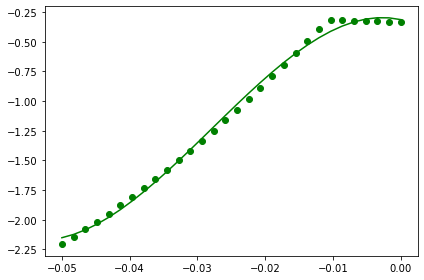

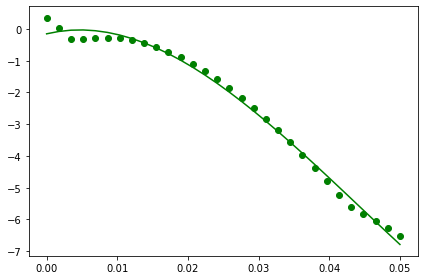

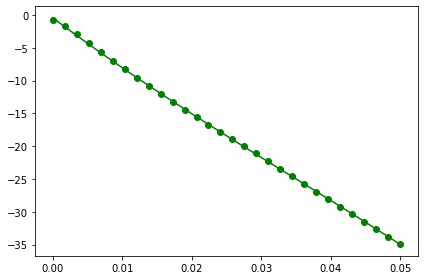

KeyboardInterrupt: 

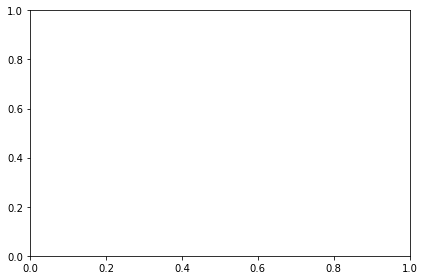

In [16]:
pressure_df=pressure_df_denoised
pressure_measure=list(pressure_df[colum_names["pressure"]["measure"]])
pressure_time=list(pressure_df[colum_names["pressure"]["time"]])
identfication_UsePattern=PatternRecognition(point_halfWindow=10,time_halfWindow=0.05)
identfication_UsePattern.learn(pressure_measure,pressure_time,ground_truth)
# identfication_UsePattern.parameters_twoPatterns
buildup,drawdown=identfication_UsePattern.predict(pressure_measure,pressure_time)
print(len(buildup),len(drawdown))
# buildup,drawdown

In [ ]:
denoised_breakpoints=
[2248, 2481, 2806, 2884, 3095, 3560, 3973, 4229, 4750, 4891, 5297, 5436, 5985, 6545, 7234, 7538, 7933, 8356, 9023, 9689, 10149, 10224, 10526, 10795, 11323, 11478, 12362, 13023, 13867, 14081, 14774, 15329, 16096, 16619, 17589, 18417, 19642, 19760, 20013, 20358, 20700, 21035, 21974, 22189, 22709, 23219, 24215, 24683, 25697, 26005, 26640, 26753, 27022, 27315, 27757, 27968, 28322, 28494, 28831, 29093]